# G2M insight for Cab Investment firm

## Task
Research the cab market in the USA and give recommendations on the choice of a company for investment.

## Imports

In [211]:
import pandas as pd
import numpy as np
import xlrd
from datetime import datetime
from matplotlib import pyplot as plt
import seaborn as sns
from pandas_profiling import ProfileReport
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

## Auxiliary methods

In [736]:
def heatmap(method):
    corr_coef_matrix = data[numeric_col + list(profiling_report.get_rejected_variables())].corr(method=method)
    plt.figure(figsize=(25, 15))
    sns.heatmap(corr_coef_matrix, annot=True, fmt='.3g')
    return plt.show()

In [710]:
def boxplot(feature):
    plt.rcParams['figure.figsize']=(10,5) 
    boxplot = sns.boxplot(data[feature])
    boxplot.axes.set_title(f"Distribution of {feature}", fontsize=16)
    boxplot.set_xlabel("Values", fontsize=14)
    boxplot.set_ylabel(feature, fontsize=14)
    return plt.show()

In [715]:
def pie_chart_users(city, pink_cab_values, yellow_cab_values, others):
    vals=[pink_cab_values, yellow_cab_values, others]
    labels = ["Pink Cab", "Yellow Cab", "Other Companies"]
    colors = ['pink','yellow','green']
    plt.title(f"Company's market share in {city}")
    plt.pie(vals,labels=labels,colors=colors,shadow=True,autopct='%1.1f%%',startangle=180)
    plt.axis('equal')
    return plt.show()

## Download Data Sets

In [73]:
cab_data = pd.read_csv(".\Cab_Data.csv", sep=',')
city= pd.read_csv(".\City.csv", sep=',')
customer_id= pd.read_csv(".\Customer_ID.csv", sep=',')
transaction_id= pd.read_csv(".\Transaction_ID.csv", sep=',')

Time period of data is from 31/01/2016 to 31/12/2018.

## Preparation of datasets

#### Cab_data data

Cab_Data.csv – this file includes details of transaction for 2 cab companies

In [76]:
#lambda function applied to column use xlrd to restore date back
cab_data['Date of Travel'] = cab_data['Date of Travel'].apply(lambda s: xlrd.xldate.xldate_as_datetime(s, 0))

In [77]:
cab_data

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.6350
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.8540
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.6320
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.6020
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.7760
...,...,...,...,...,...,...,...
359387,10440101,2018-01-08,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600
359388,10440104,2018-01-04,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480
359389,10440105,2018-01-05,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500
359390,10440106,2018-01-05,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480


In [78]:
cab_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 359392 entries, 0 to 359391
Data columns (total 7 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Transaction ID  359392 non-null  int64         
 1   Date of Travel  359392 non-null  datetime64[ns]
 2   Company         359392 non-null  object        
 3   City            359392 non-null  object        
 4   KM Travelled    359392 non-null  float64       
 5   Price Charged   359392 non-null  float64       
 6   Cost of Trip    359392 non-null  float64       
dtypes: datetime64[ns](1), float64(3), int64(1), object(2)
memory usage: 19.2+ MB


##### Description of Cab_Data.csv:

Transaction ID (numeric) - transaction identifier;

Date of Travel (datetime) - date of the trip transaction;

Company (categorical: 'Yellow Cab', 'Pink Cab') - cab company name;

City (categorical: city and state names) - city and state of the USA where the trip was made;

KM Travelled (numeric) - the distance of the trip;

Price Charged (numeric) - user's expenses for a cab ride;

Cost of Trip (numeric) - cab company's travel expenses.

#### City data

City.csv – this file contains list of US cities, their population and number of cab users

In [42]:
city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     object
 2   Users       20 non-null     object
dtypes: object(3)
memory usage: 608.0+ bytes


In [74]:
# converting column 'Population' and 'Users' data type to float type
city["Population"] = city["Population"].str.replace(',', '').astype(int)
city["Users"] = city["Users"].str.replace(',', '').astype(int)

In [75]:
city

,City,Population,Users
0,NEW YORK NY,8405837,302149
1,CHICAGO IL,1955130,164468
2,LOS ANGELES CA,1595037,144132
3,MIAMI FL,1339155,17675
4,SILICON VALLEY,1177609,27247
5,ORANGE COUNTY,1030185,12994
6,SAN DIEGO CA,959307,69995
7,PHOENIX AZ,943999,6133
8,DALLAS TX,942908,22157
9,ATLANTA GA,814885,24701


In [79]:
city.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   City        20 non-null     object
 1   Population  20 non-null     int32 
 2   Users       20 non-null     int32 
dtypes: int32(2), object(1)
memory usage: 448.0+ bytes


##### Description of City.csv:

City (categorical: 19 city and state names) - city and state of the USA;

Population (numeric) - the population of the city;

Users (numeric) - number of cab users in the city.


#### Customer ID data

In [20]:
customer_id

,Customer ID,Gender,Age,Income (USD/Month)
0,29290,Male,28,10813
1,27703,Male,27,9237
2,28712,Male,53,11242
3,28020,Male,23,23327
4,27182,Male,33,8536
...,...,...,...,...
49166,12490,Male,33,18713
49167,14971,Male,30,15346
49168,41414,Male,38,3960
49169,41677,Male,23,19454


Customer_ID.csv – this is a mapping table that contains a unique identifier which links the customer’s demographic details

In [46]:
customer_id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49171 entries, 0 to 49170
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         49171 non-null  int64 
 1   Gender              49171 non-null  object
 2   Age                 49171 non-null  int64 
 3   Income (USD/Month)  49171 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 1.5+ MB


##### Description of Customer_ID.csv:

Customer ID (numeric) - customer identifier;

Gender (categorical: 'Male', 'Female') - customer gender;

Age (numeric) - customer age;

Income (numeric) - customer income per month (USD).

#### Transaction ID data

In [21]:
transaction_id

,Transaction ID,Customer ID,Payment_Mode
0,10000011,29290,Card
1,10000012,27703,Card
2,10000013,28712,Cash
3,10000014,28020,Cash
4,10000015,27182,Card
...,...,...,...
440093,10440104,53286,Cash
440094,10440105,52265,Cash
440095,10440106,52175,Card
440096,10440107,52917,Card


Transaction_ID.csv – this is a mapping table that contains transaction to customer mapping and payment mode

In [47]:
transaction_id.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 440098 entries, 0 to 440097
Data columns (total 3 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   Transaction ID  440098 non-null  int64 
 1   Customer ID     440098 non-null  int64 
 2   Payment_Mode    440098 non-null  object
dtypes: int64(2), object(1)
memory usage: 10.1+ MB


##### Description of Transaction_ID.csv:

Transaction ID (numeric) - transaction identifier;

Customer ID (numeric) - customer identifier;

Payment_Mode (categorical: 'Card', 'Cash') - fare payment method.

## Hypothesis

- Hypothesis No.1: The more transactions a company has, the higher its efficiency.
- Hypothesis No.2: The more unique customers a company has, the higher its efficiency.
- Hypothesis No.3: The larger the company's revenue, the higher its efficiency.
- Hypothesis No.4: The more transactions a company has in a particular city, the higher its efficiency in that city relative to another company.
- Hypothesis No.5: The larger the population of a city, the more trips there are.
- Hypothesis No.6: The larger the population of the city, the higher the efficiency.
- Hypothesis No.7: The higher the income of the company's customers, the higher its efficiency.
- Hypothesis No.8: When paying for a trip with a bank card, the efficiency of the company is lower than when paying in cash.
- Hypothesis No.9: Loyal customers lead to greater efficiency.
- Hypothesis No.10: The more profit from one trip, the higher the efficiency.

### Сoncatenation of data by a common column

Let's combine table 'transaction_id' and table 'customer_id' by common column "Customer ID". Each transaction has a customer who executed it.

In [80]:
transction_customer_merge=transaction_id.merge(customer_id, left_on="Customer ID", right_on="Customer ID", how='outer')
transction_customer_merge

,Transaction ID,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,29290,Card,Male,28,10813
1,10351127,29290,Cash,Male,28,10813
2,10412921,29290,Card,Male,28,10813
3,10000012,27703,Card,Male,27,9237
4,10320494,27703,Card,Male,27,9237
...,...,...,...,...,...,...
440093,10439799,12490,Cash,Male,33,18713
440094,10439820,14971,Card,Male,30,15346
440095,10439838,41414,Card,Male,38,3960
440096,10439840,41677,Cash,Male,23,19454


Similarly, let's combine table 'cab_data' and table 'city' by common column "City". 

In [81]:
cab_data_city_merge=cab_data.merge(city, left_on="City", right_on="City", how='inner')
cab_data_city_merge

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,814885,24701
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,814885,24701
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.6320,814885,24701
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.6020,814885,24701
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.7760,814885,24701
...,...,...,...,...,...,...,...,...,...
359387,10440101,2018-01-08,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600,418859,127001
359388,10440104,2018-01-04,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480,418859,127001
359389,10440105,2018-01-05,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500,418859,127001
359390,10440106,2018-01-05,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480,418859,127001


### Creating the main dataset

Finally, let's combine the two resulting tables into one by the common variable "Transaction ID". In this case, we will get a dataset with information about all transactions, the customers who made it, and in which cities with what characteristics it was made.

In [82]:
data=cab_data_city_merge.merge(transction_customer_merge, left_on="Transaction ID", right_on="Transaction ID", how='inner')
data

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)
0,10000011,2016-01-08,Pink Cab,ATLANTA GA,30.45,370.95,313.6350,814885,24701,29290,Card,Male,28,10813
1,10000012,2016-01-06,Pink Cab,ATLANTA GA,28.62,358.52,334.8540,814885,24701,27703,Card,Male,27,9237
2,10000013,2016-01-02,Pink Cab,ATLANTA GA,9.04,125.20,97.6320,814885,24701,28712,Cash,Male,53,11242
3,10000014,2016-01-07,Pink Cab,ATLANTA GA,33.17,377.40,351.6020,814885,24701,28020,Cash,Male,23,23327
4,10000015,2016-01-03,Pink Cab,ATLANTA GA,8.73,114.62,97.7760,814885,24701,27182,Card,Male,33,8536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
359387,10440101,2018-01-08,Yellow Cab,WASHINGTON DC,4.80,69.24,63.3600,418859,127001,52392,Cash,Male,24,15651
359388,10440104,2018-01-04,Yellow Cab,WASHINGTON DC,8.40,113.75,106.8480,418859,127001,53286,Cash,Male,32,6528
359389,10440105,2018-01-05,Yellow Cab,WASHINGTON DC,27.75,437.07,349.6500,418859,127001,52265,Cash,Male,56,7966
359390,10440106,2018-01-05,Yellow Cab,WASHINGTON DC,8.80,146.19,114.0480,418859,127001,52175,Card,Male,32,6423


### Missing values

In [83]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 359392 entries, 0 to 359391
Data columns (total 14 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   Transaction ID      359392 non-null  int64         
 1   Date of Travel      359392 non-null  datetime64[ns]
 2   Company             359392 non-null  object        
 3   City                359392 non-null  object        
 4   KM Travelled        359392 non-null  float64       
 5   Price Charged       359392 non-null  float64       
 6   Cost of Trip        359392 non-null  float64       
 7   Population          359392 non-null  int32         
 8   Users               359392 non-null  int32         
 9   Customer ID         359392 non-null  int64         
 10  Payment_Mode        359392 non-null  object        
 11  Gender              359392 non-null  object        
 12  Age                 359392 non-null  int64         
 13  Income (USD/Month)  359392 no

There are no missing values in the data

### Duplicates

In [84]:
data[data.duplicated(keep=False)]

,Transaction ID,Date of Travel,Company,City,KM Travelled,Price Charged,Cost of Trip,Population,Users,Customer ID,Payment_Mode,Gender,Age,Income (USD/Month)


Duplicates were not found because the correct ways to join tables were chosen

### Descriptive Statictics

In [85]:
data.describe()

,Transaction ID,KM Travelled,Price Charged,Cost of Trip,Population,Users,Customer ID,Age,Income (USD/Month)
count,3.593920e+05,359392.000000,359392.000000,359392.000000,3.593920e+05,359392.000000,359392.000000,359392.000000,359392.000000
mean,1.022076e+07,22.567254,423.443311,286.190113,3.132198e+06,158365.582267,19191.652115,35.336705,15048.822937
std,1.268058e+05,12.233526,274.378911,157.993661,3.315194e+06,100850.051020,21012.412463,12.594234,7969.409482
min,1.000001e+07,1.900000,15.600000,19.000000,2.489680e+05,3643.000000,1.000000,18.000000,2000.000000
25%,1.011081e+07,12.000000,206.437500,151.200000,6.712380e+05,80021.000000,2705.000000,25.000000,8424.000000
50%,1.022104e+07,22.440000,386.360000,282.480000,1.595037e+06,144132.000000,7459.000000,33.000000,14685.000000
75%,1.033094e+07,32.960000,583.660000,413.683200,8.405837e+06,302149.000000,36078.000000,42.000000,21035.000000
max,1.044011e+07,48.000000,2048.030000,691.200000,8.405837e+06,302149.000000,60000.000000,65.000000,35000.000000


Notes:
- 25 percent of trips are very expensive for users (from 583 to 2000 dollars). Perhaps it depends on how many kilometers users had to travel or on what day the trip was made;
- The longest distance traveled by taxi was 40 km;
- According to the idea, the price charged from the user should exceed the cost of the trip, otherwise the companies will work at a loss. But at the minimum values of these variables, the opposite situation is observed. Such cases do occur, but are extremely rare. It can be assumed that this is due to the loyalty program or the coverage of part of the cost by user bonuses or other privileges;
- The average age is 35 year.

### Pandas profiling

In [208]:
prof = ProfileReport(data)
prof.to_file(output_file='output.html')
prof

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

In [728]:
numeric_col = ['Transaction ID','KM Travelled','Price Charged','Cost of Trip','Population','Users','Customer ID','Age','Income (USD/Month)']
categorical_col = ['Company', 'City', 'Payment_Mode', 'Gender']

### Different correlation coefficients

#### Peasron correlation coefficient

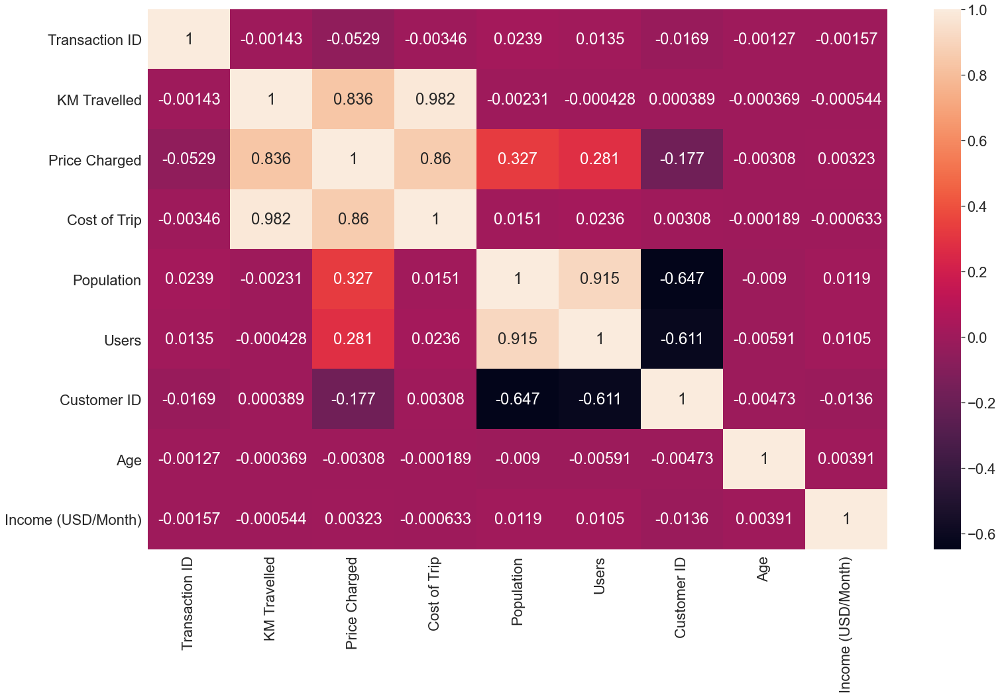

In [733]:
heatmap('pearson')

#### Spearman correlation coefficient

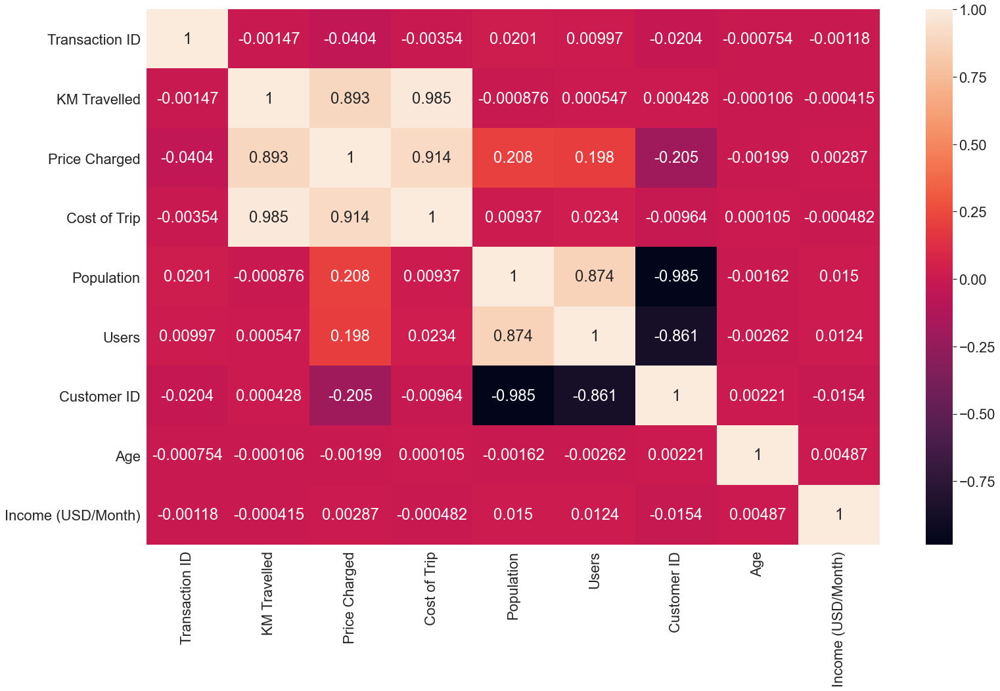

In [734]:
heatmap('spearman')

#### Kendall correlation coefficient

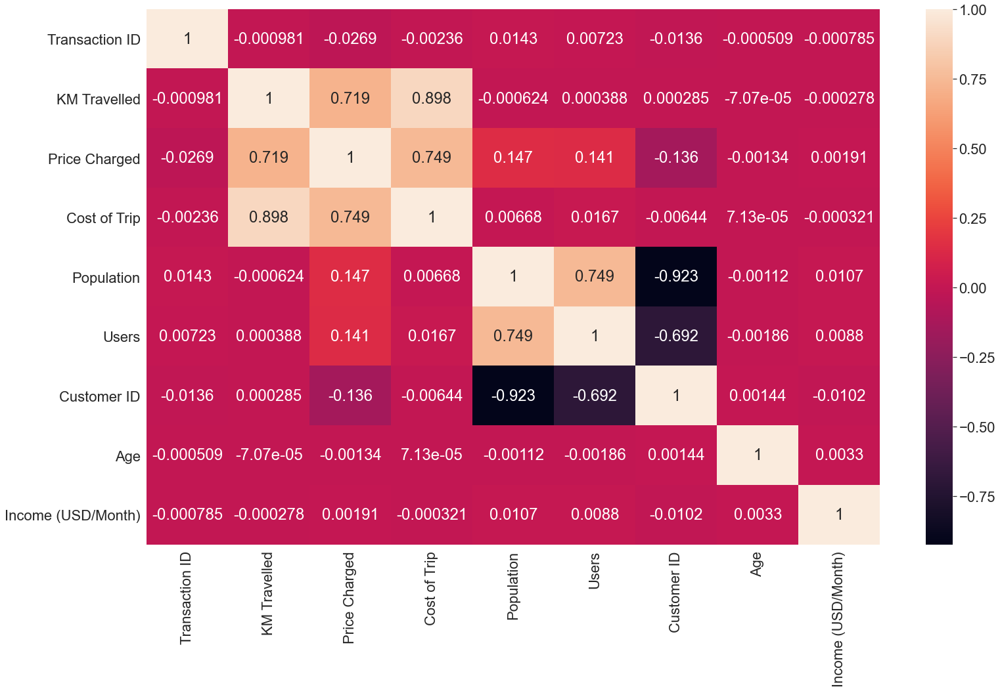

In [735]:
heatmap('kendall')

### To sum up:
1. There are 359392 observations in the main dataset.
2. The final dataset contains 14 variables: 9 numerical features, 4 categorical features and one datatime.
3. No missing values and no duplicates.
4. "Transaction ID" is unique variable.
5. "Company", "Payment_Mode" and "Gender" are categorical binary features.
6. The number of transactions in the "Yellow Cab" company is more than transactions in the "Pink Cab" by about 3 times.
7. Data represents 19 USA cities, its population and the number of cab users.
8. The largest number of transactions is observed in New York, namely almost 100 thousand. It is logical, because it is the largest city in America in terms of population.
9. The average number of kilometers traveled for all transactions in both companies is about 22.5 kilometers.
10. The minimum of "Price Charged" is 15.6, the maximum is 2048.03 dollars.
11. The average cost of trip is 286.19 dollars.
12. 46148 unique customers.
13. In most cases, users pay by card for the trip.
14. The number of male users exceeds the number of female users by 52432.
15. The minimum age for cab users is 18 years old and the maximum age is 65 years old.
16. The average income of taxi users is 15049 dollars per month. The minimum income is 2000 and the maximum income is 35000 dollars.
17. A high correlation is observed between the following features: "Population", "Users", "Customer ID". And also between another group of variables, namely "KM Travelled", "Price Charged" and "Cost of Trip".

## EDA

### Outliers

#### Distribution of numeric data

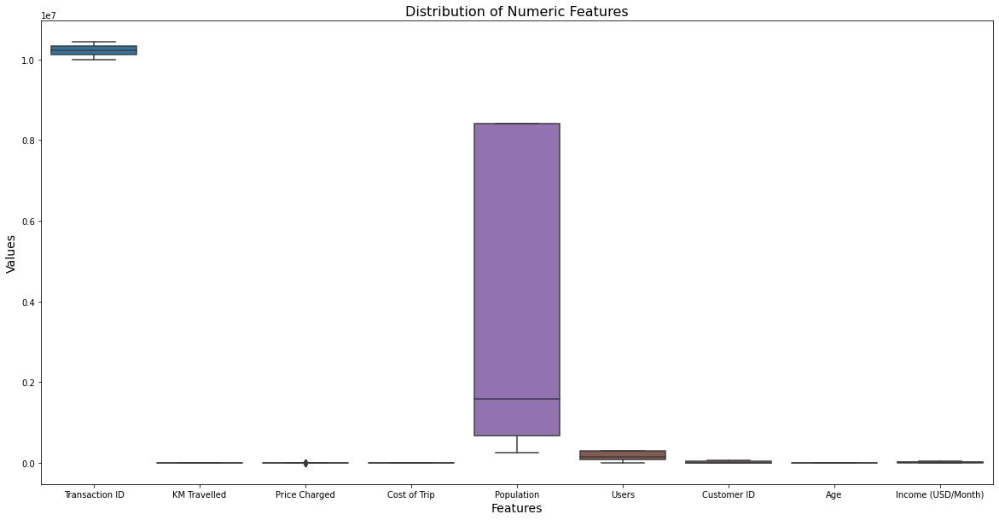

In [148]:
num_data_plot = pd.DataFrame(data=data, columns=numeric_col)
plt.rcParams['figure.figsize']=(20,10) 
boxplot = sns.boxplot(x="variable", y="value", data=pd.melt(num_data_plot))
boxplot.axes.set_title("Distribution of Numeric Features", fontsize=16)
boxplot.set_xlabel("Features", fontsize=14)
boxplot.set_ylabel("Values", fontsize=14)
plt.show()


Non-representative graph, because the data is not normalized.

Let's look at each feature separately.

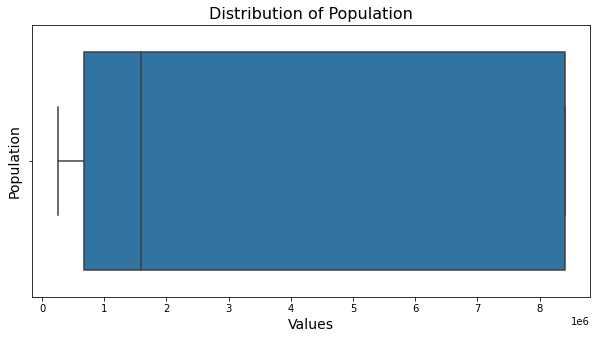

In [195]:
boxplot('Population')

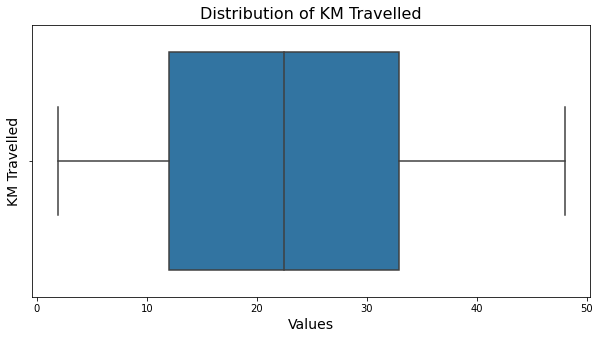

In [196]:
boxplot('KM Travelled')

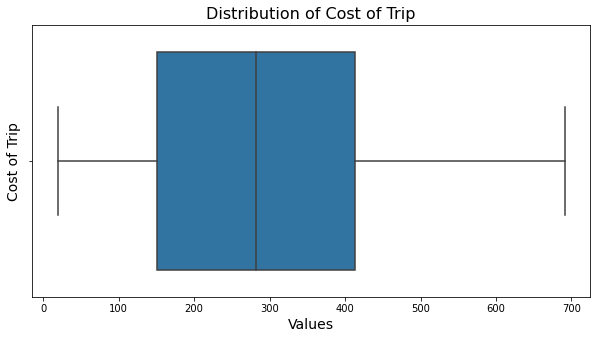

In [197]:
boxplot('Cost of Trip')

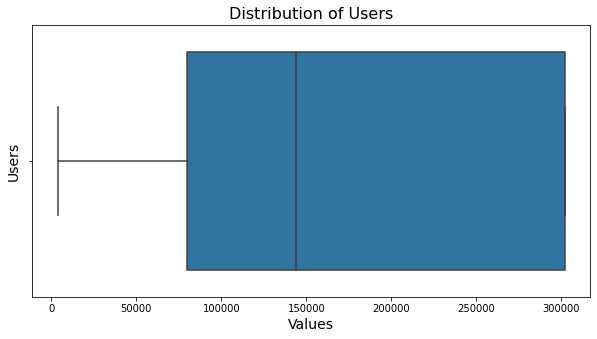

In [198]:
boxplot('Users')

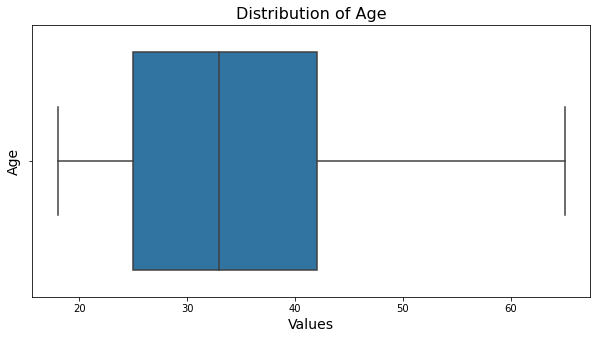

In [199]:
boxplot('Age')

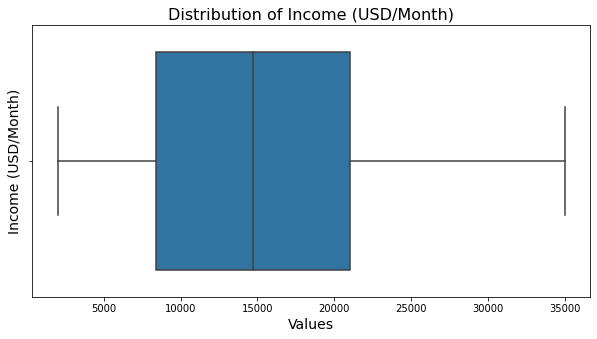

In [200]:
boxplot('Income (USD/Month)')

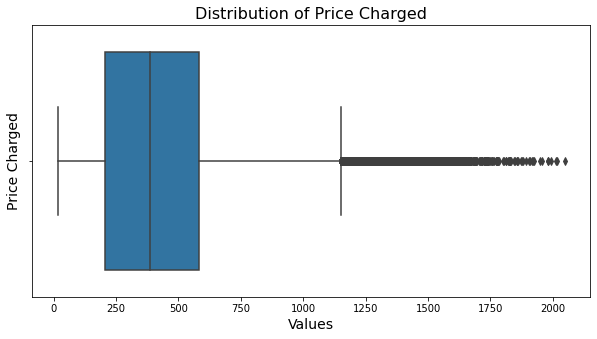

In [253]:
boxplot('Price Charged')

Outliers are observed in only one feature, namely 'Price of Charged'. Let's check if they are. Namely, let's look at the distribution of costs for customers and the company per 1 km.

In [357]:
data['Price per KM']=data['Price Charged']/data['KM Travelled']

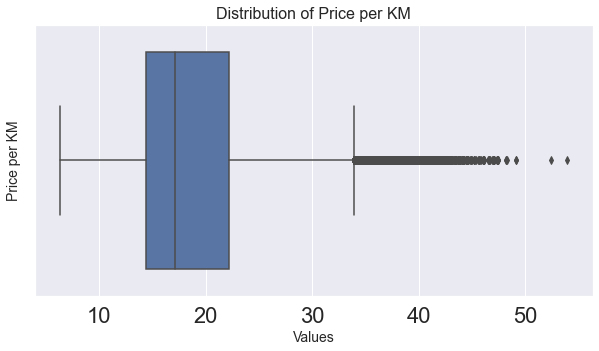

In [359]:
boxplot('Price per KM')

In [360]:
data['Cost of Trip per KM']=data['Cost of Trip']/data['KM Travelled']

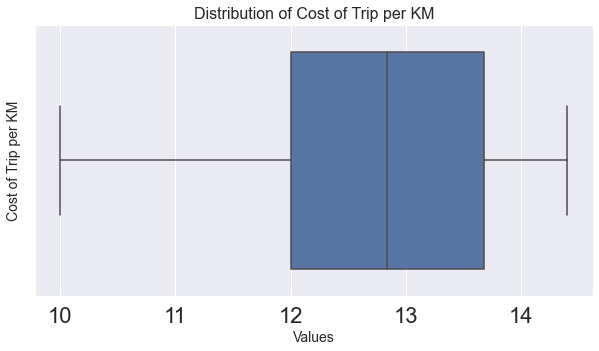

In [361]:
boxplot('Cost of Trip per KM')

Based on the schedule of companies' costs per 1 km, it can be said that the outliers in the "Price Charged" graph are not outliers, since most likely a cab takes a larger margin for a longer distance.

#### Transaction ID

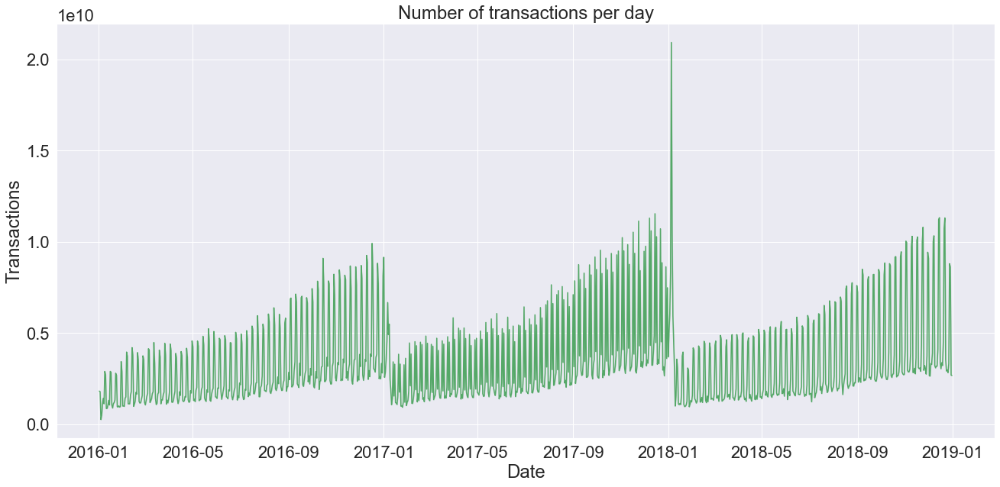

In [335]:
f, axes = plt.subplots(figsize=(22, 10))
ax = sns.lineplot(x="Date of Travel", y="Transaction ID", data=data, estimator=np.sum, color='g')

plt.title('Number of transactions per day')
plt.xlabel('Date')
plt.ylabel('Transactions')
plt.show()

Looking at the graph, there is seasonality from year to year. The number of transactions increases monotonically from the beginning to the end of the year. We also see a peak that falls on December 2017 - January 2018.

Subsequently, before building the model, it will be necessary to get rid of seasonality.

Now let's look at the data by month.

In [230]:
# add 2 new columns "Year" and "Month"
data["Year"] = data['Date of Travel'].dt.year
data["Month"] = data['Date of Travel'].dt.month

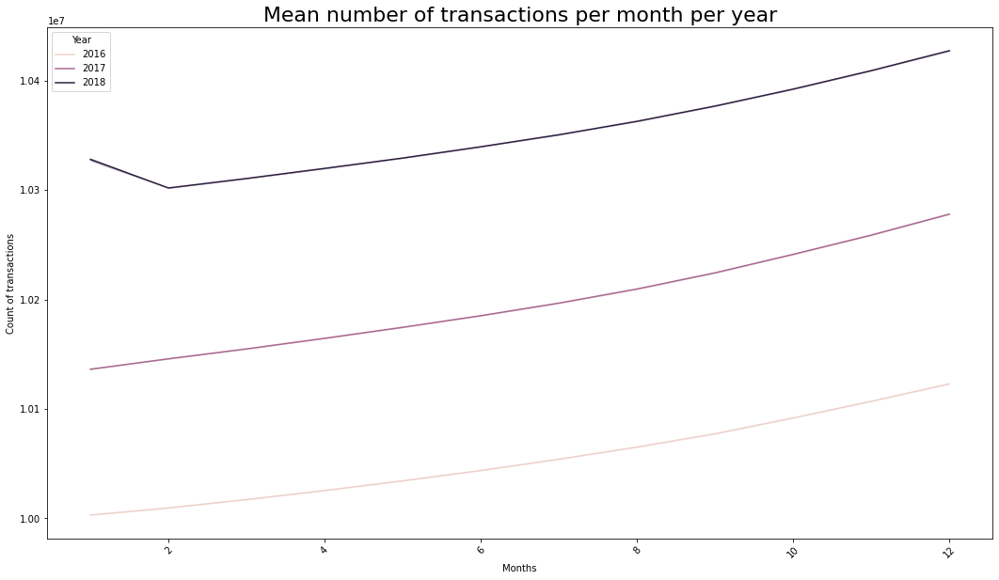

In [234]:
plt.figure(figsize = (18,10))
plt.title('Mean number of transactions per month per year', fontsize=22)
ax = sns.lineplot(x='Month', y="Transaction ID", hue="Year", data=data, estimator=np.mean)
ax = ax.set(xlabel='Months', ylabel='Count of transactions')
plt.xticks(rotation=45)
plt.show()

As for the average number of transactions over the years, every year the same month shows an increase in transactions, also throughout the year, the average number of transactions increases.

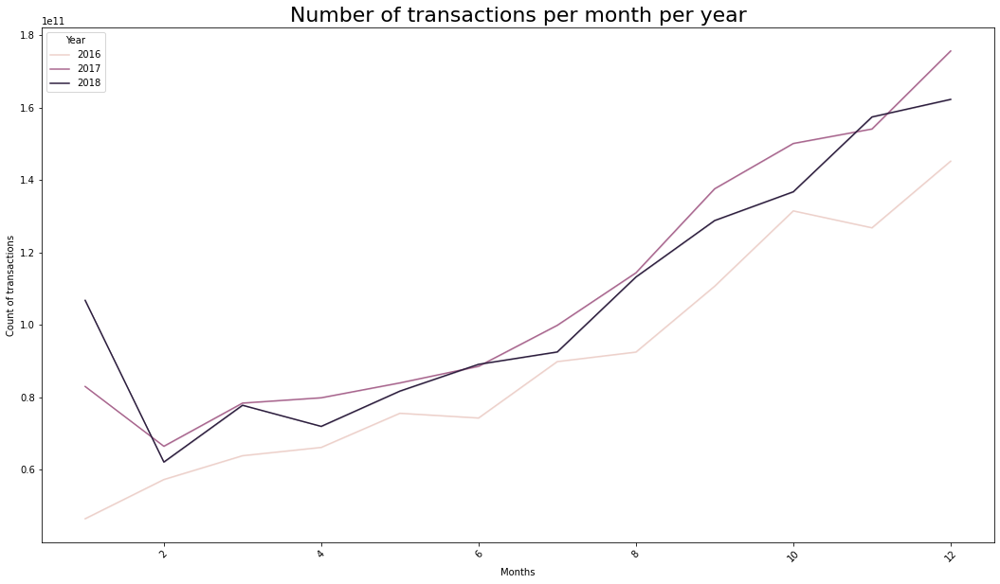

In [236]:
plt.figure(figsize = (18,10))
plt.title('Number of transactions per month per year', fontsize=22)
ax = sns.lineplot(x='Month', y="Transaction ID", hue="Year", data=data, estimator=np.sum)
ax = ax.set(xlabel='Months', ylabel='Count of transactions')
plt.xticks(rotation=45)
plt.show()

The largest number of transactions was made in 2017, however, 2018 has similar values, the smallest in 2016.

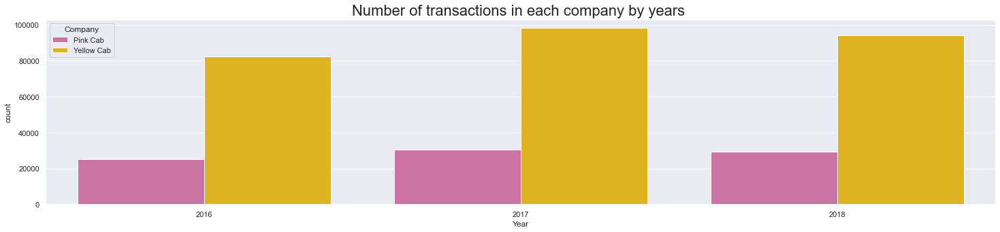

In [744]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Year', hue='Company', data=data, palette=palette)
plt.title('Number of transactions in each company by years ', fontsize=22)
plt.show()
sns.set(font_scale=2)

Let's create another column with the day of the week and see how transactions behave by day of the week.

In [303]:
data["Week"] = data['Date of Travel'].dt.day_name()

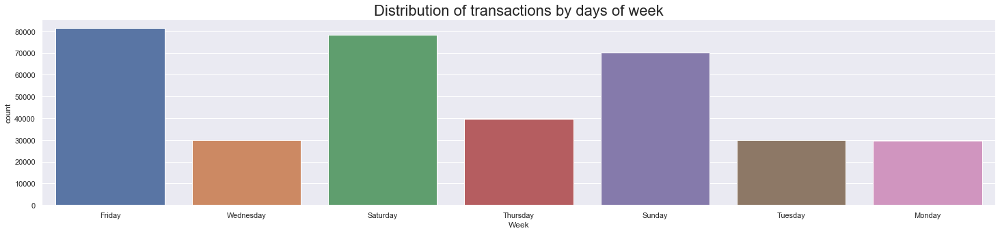

In [711]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Week', data=data)
plt.title('Distribution of transactions by days of week', fontsize=22)
plt.xlabel('Week')
plt.show()
sns.set(font_scale=2)

The most popular days of the week are Friday, Saturday and Sunday. This is due to the fact that on weekends people are more likely to relax, rest, meet friends and use a cab to get to a certain place, as this is the most comfortable way to travel. It is also worth noting that these days people often return home late when other ways getting home is just not there.

#### Company

Let's see how things are in individual companies, whether the trend will repeat.

In [329]:
palette = ['#d965a4', '#ffc400']

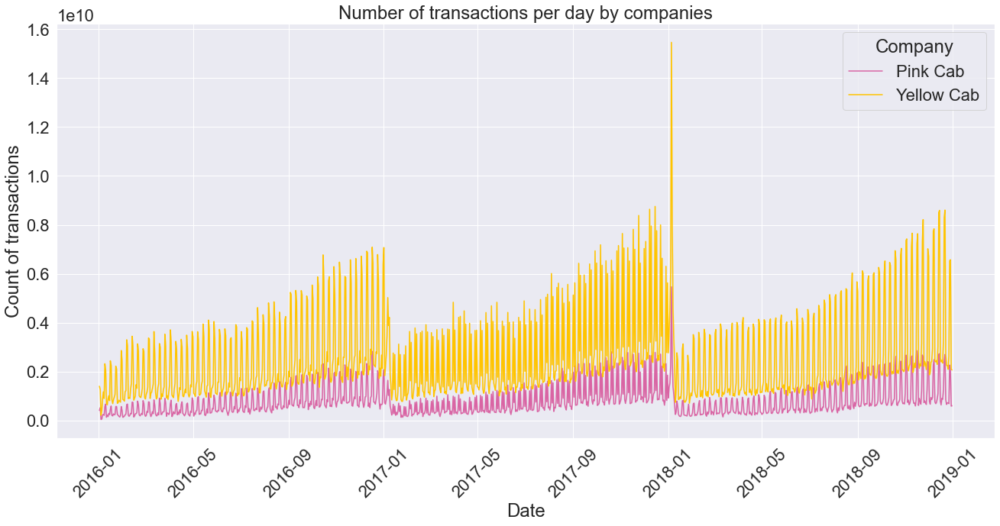

In [712]:
f, axes = plt.subplots(figsize=(22, 10), sharex=True)
ax = sns.lineplot(x="Date of Travel", y="Transaction ID", hue="Company", data=data, estimator=np.sum, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Count of transactions')
plt.title('Number of transactions per day by companies')
plt.xticks(rotation=45)
plt.show()

The situation is exactly the same as in the general graph, each company's number of transactions increases seasonally.

In addition, it can be seen that the Yellow Cab company has a lot more transactions compared to the Pink Cab.

#### KM_Travelled

We divide the range of the variable "KM_Travelled" into 3 parts by values of quantiles.

In [248]:
data['Type of Distance']=data['KM Travelled'].apply(lambda x: 'Small Distance' if x<12 else 'Average' if x<32.96 else 'Long Distance')

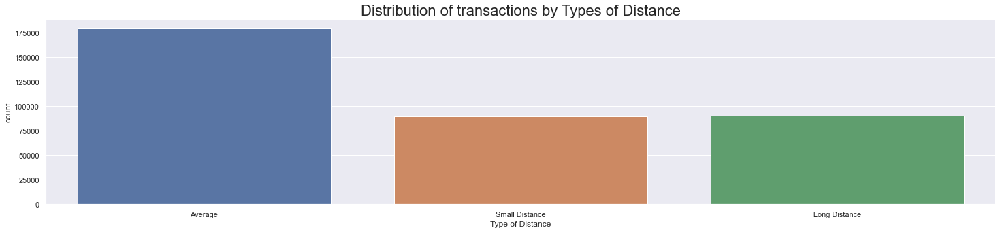

In [713]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Type of Distance', data=data)
plt.title('Distribution of transactions by Types of Distance', fontsize=22)
plt.xlabel('Type of Distance')
plt.show()
sns.set(font_scale=2)


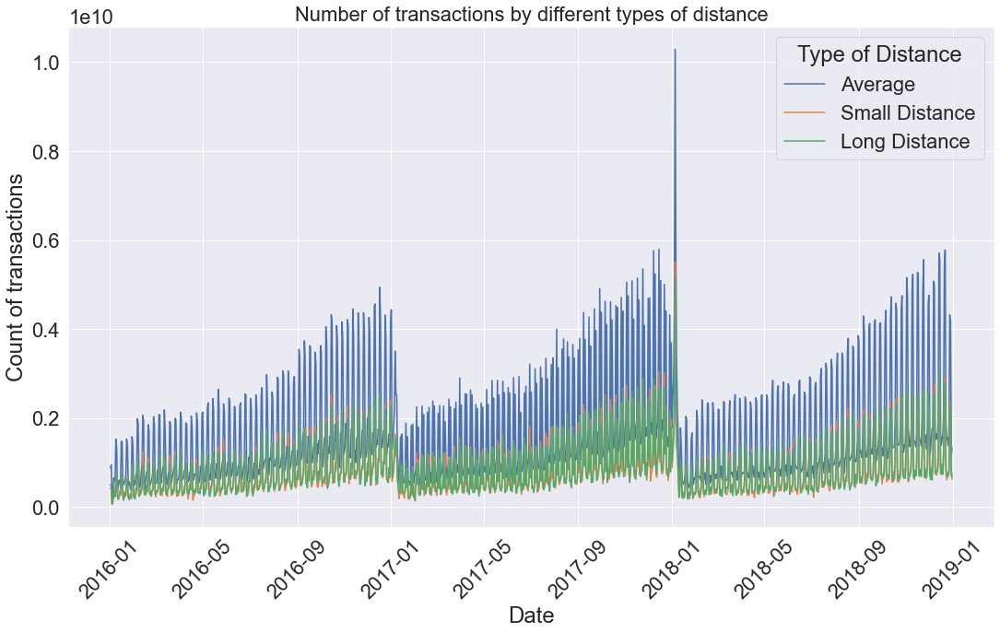

In [714]:
plt.figure(figsize = (18,10))
plt.title('Number of transactions by different types of distance', fontsize=22)
ax = sns.lineplot(x='Date of Travel', y="Transaction ID", hue="Type of Distance", data=data, estimator=np.sum)
ax = ax.set(xlabel='Date', ylabel='Count of transactions')
plt.xticks(rotation=45)
plt.show()

Trips over an average distance from 12 to 32.96 km prevail. There are almost the same number of trips for long and short distances, which is to be expected.

#### Population

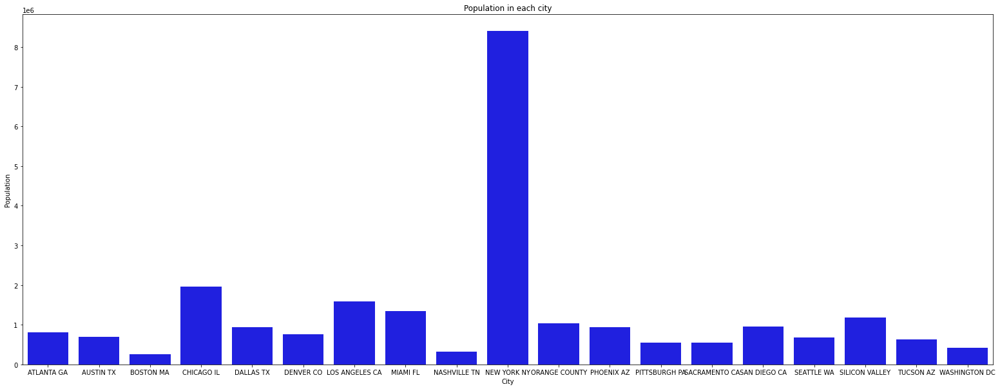

In [239]:
f, axes = plt.subplots(figsize=(27, 10), sharex=True)
ax = sns.barplot(x="City", y="Population", data=data, estimator=np.mean, color='b').set_title("Population in each city")
plt.show()

New York is strongly in the lead in terms of population among 19 cities in America

#### City

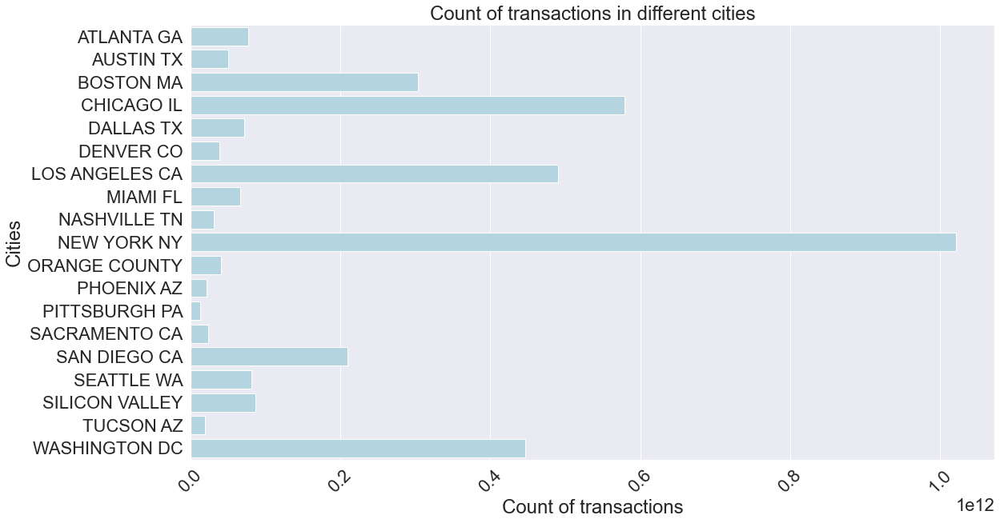

In [339]:
plt.figure(figsize = (18,10))
plt.title('Count of transactions in different cities', fontsize=24)
ax = sns.barplot(x='Transaction ID', y='City', data=data, estimator=np.sum, color='lightblue')
ax = ax.set(xlabel='Count of transactions', ylabel='Cities')
plt.xticks(rotation=45)
plt.show() 

The largest number of transactions are made in the city of New York, which is most likely due to the fact that this is the city with the largest population in America. You can also notice that 5 cities stand out against the general background, namely Boston, Chicago, Los Angeles, Washington and San Diego. The rest perform approximately the same number of transactions over the presented 3 years.

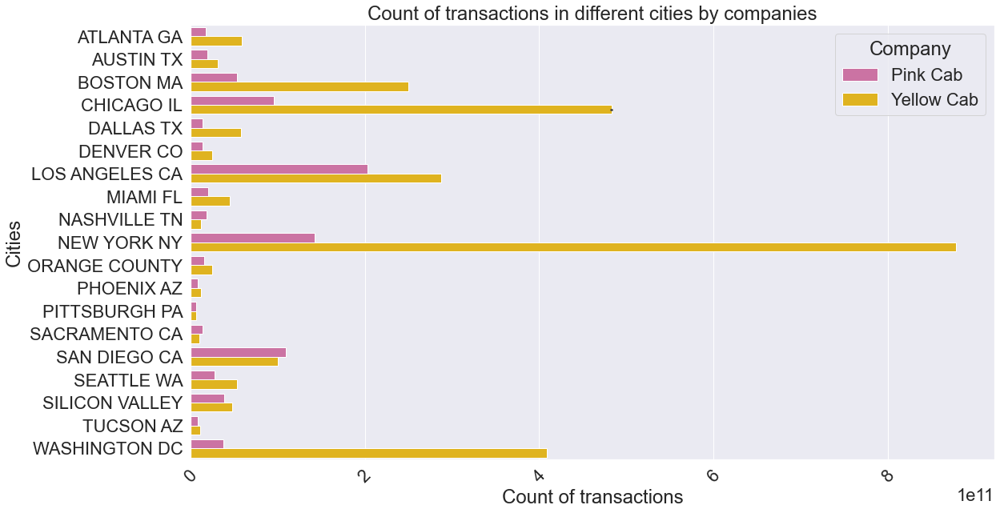

In [340]:
plt.figure(figsize = (18,10))
plt.title('Count of transactions in different cities by companies', fontsize=24)
ax = sns.barplot(x='Transaction ID', y='City',  hue='Company', data=data, estimator=np.sum, palette = palette)
ax = ax.set(xlabel='Count of transactions', ylabel='Cities')
plt.xticks(rotation=45)
plt.show() 

On the graph by companies, Yellow Cab is most in demand in New York, with cities such as Chicago, Washington, Los Angeles and Boston also standing out. San Diego is a little behind. 

As for the Pink Cab, all the most transactions are observed in Los Angeles, then in New York, San Diego and Chicago. Boston and Washington to a lesser extent.

It can be seen that not all of the most populated cities are in demand from these cab companies. Either in cities like Miami, other companies are in the lead, or it is connected with something else, perhaps with the logistics of the city.

#### Users

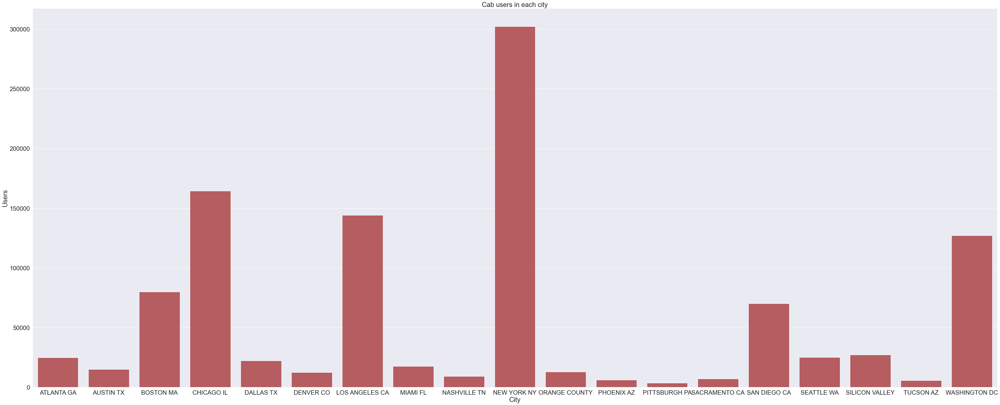

In [356]:
f, axes = plt.subplots(figsize=(62, 25), sharex=True)
ax = sns.barplot(x="City", y="Users", data=data, estimator=np.mean, color='r').set_title("Cab users in each city")
plt.show()

Thanks to the chart of the number of cab users by city, we get that the number of transactions in cities depends on the population of the city, but on active cab users.

To create a table of Customer ID count:

In [396]:
share_users=data[['City','Company', 'Customer ID']].groupby(['City','Company']).count()

In [489]:
share_users

Customer ID
City           Company                
ATLANTA GA     Pink Cab           1762
               Yellow Cab         5795
AUSTIN TX      Pink Cab           1868
               Yellow Cab         3028
BOSTON MA      Pink Cab           5186
               Yellow Cab        24506
CHICAGO IL     Pink Cab           9361
               Yellow Cab        47264
DALLAS TX      Pink Cab           1380
               Yellow Cab         5637
DENVER CO      Pink Cab           1394
               Yellow Cab         2431
LOS ANGELES CA Pink Cab          19865
               Yellow Cab        28168
MIAMI FL       Pink Cab           2002
               Yellow Cab         4452
NASHVILLE TN   Pink Cab           1841
               Yellow Cab         1169
NEW YORK NY    Pink Cab          13967
               Yellow Cab        85918
ORANGE COUNTY  Pink Cab           1513
               Yellow Cab         2469
PHOENIX AZ     Pink Cab            864
               Yellow Cab         1200
PITTSBURGH PA  Pink Cab            682
               Yellow Cab          631
SACRAMENTO CA  Pink Cab           1334
               Yellow Cab         1033
SAN DIEGO CA   Pink Cab          10672
               Yellow Cab         9816
SEATTLE WA     Pink Cab           2732
               Yellow Cab         5265
SILICON VALLEY Pink Cab           3797
               Yellow Cab         4722
TUCSON AZ      Pink Cab            799
               Yellow Cab         1132
WASHINGTON DC  Pink Cab           3692
               Yellow Cab        40045

To add columns "Population" and "Users" for each city:

In [397]:
share_users_city_merge=share_users.merge(city, left_on="City", right_on="City", how='outer')

In [401]:
share_users_city_merge[share_users_city_merge['City']=='NEW YORK NY']

,City,Customer ID,Population,Users
18,NEW YORK NY,13967.0,8405837,302149
19,NEW YORK NY,85918.0,8405837,302149


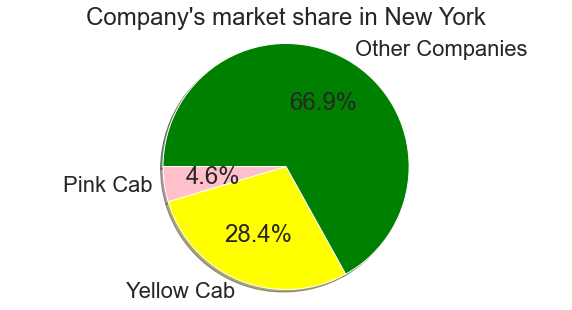

In [411]:
pie_chart_users('New York', 13967.0, 85918.0, 302149-(13967.0+85918.0))

In [410]:
share_users_city_merge[share_users_city_merge['City']=='LOS ANGELES CA']

,City,Customer ID,Population,Users
12,LOS ANGELES CA,19865.0,1595037,144132
13,LOS ANGELES CA,28168.0,1595037,144132


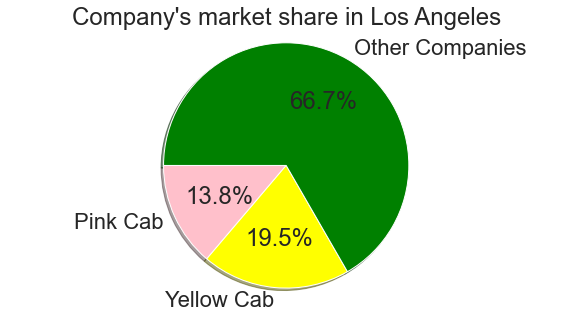

In [412]:
pie_chart_users('Los Angeles', 19865.0, 28168.0, 144132-(19865.0+28168.0))

In [413]:
share_users_city_merge[share_users_city_merge['City']=='CHICAGO IL']

,City,Customer ID,Population,Users
6,CHICAGO IL,9361.0,1955130,164468
7,CHICAGO IL,47264.0,1955130,164468


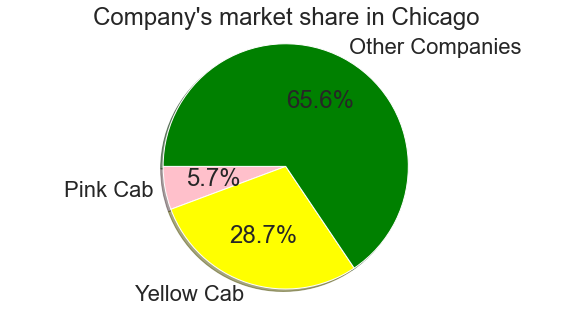

In [414]:
pie_chart_users('Chicago', 9361.0, 47264.0, 164468-(9361.0 + 47264.0))

In [415]:
share_users_city_merge[share_users_city_merge['City']=='WASHINGTON DC']

,City,Customer ID,Population,Users
36,WASHINGTON DC,3692.0,418859,127001
37,WASHINGTON DC,40045.0,418859,127001


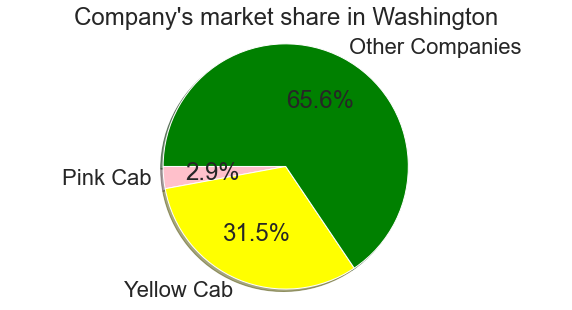

In [418]:
pie_chart_users('Washington', 3692.0, 40045.0, 127001-(3692.0+40045.0))

In [416]:
share_users_city_merge[share_users_city_merge['City']=='BOSTON MA']

,City,Customer ID,Population,Users
4,BOSTON MA,5186.0,248968,80021
5,BOSTON MA,24506.0,248968,80021


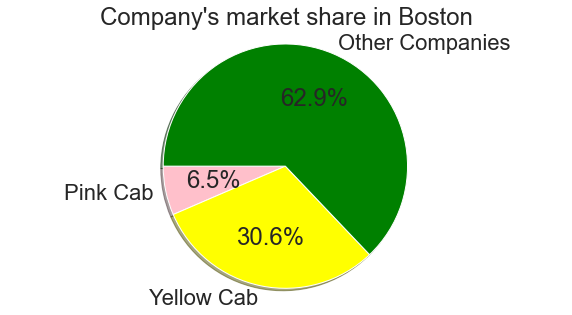

In [420]:
pie_chart_users('Boston', 5186.0, 24506.0, 80021-(5186.0 + 24506.0))

In [417]:
share_users_city_merge[share_users_city_merge['City']=='SAN DIEGO CA']

,City,Customer ID,Population,Users
28,SAN DIEGO CA,10672.0,959307,69995
29,SAN DIEGO CA,9816.0,959307,69995


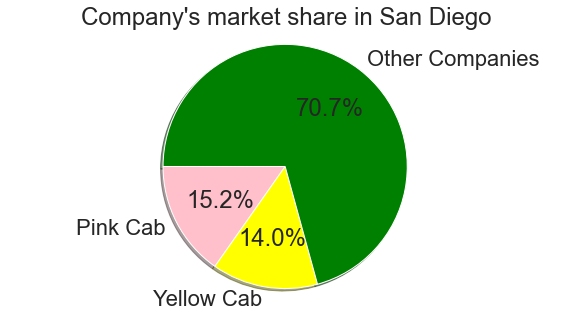

In [421]:
pie_chart_users('San Diego', 10672.0, 9816.0, 69995-(10672.0 + 9816.0))

In the cities with the largest number of users in almost all cities, almost 30% of all users are occupied by Yellow Cab, with the exception of San Diego, where Pink Cab outperformed Yellow cab by 1%.

In addition, in total, in all such cities, both companies together occupy about 30-35% of all users.

#### Age

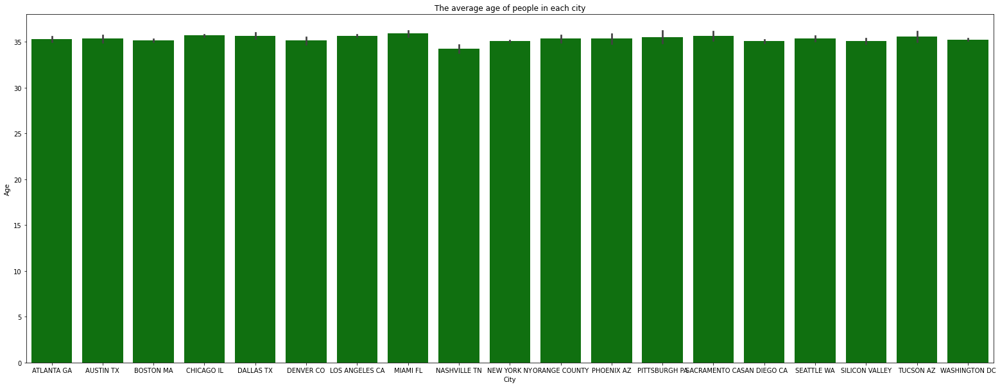

In [226]:
f, axes = plt.subplots(figsize=(27, 10), sharex=True)
ax = sns.barplot(x="City", y="Age", data=data, estimator=np.mean, color='g').set_title("The average age of people in each city")
plt.show()


There is a similar trend, the average age of users is 35 years in almost all the USA cities

Let's divide customers into age groups and see the number of transactions for each of them.

Age Groups:
- 'Young Adult' - less 35 years
- 'Middle-aged Adult' - from 35 to 55 years
- 'Older Adult' - more than 55 years

In [278]:
data['Age Groups']=data['Age'].apply(lambda x: 'Young Adult' if x<35 else 'Middle-aged Adult' if x<55 else 'Older Adult')

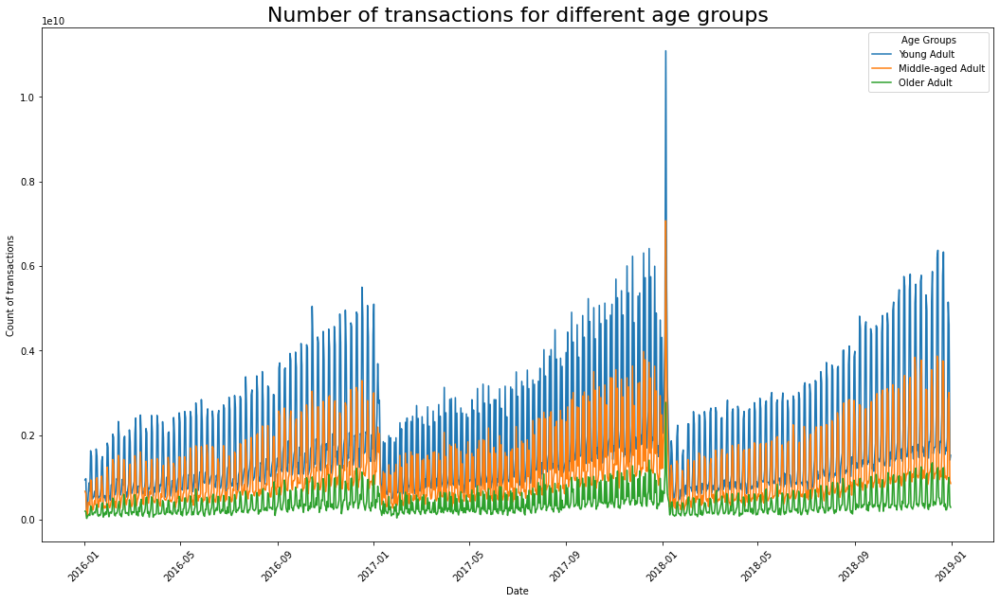

In [280]:
plt.figure(figsize = (18,10))
plt.title('Number of transactions for different age groups', fontsize=22)
ax = sns.lineplot(x='Date of Travel', y="Transaction ID", hue="Age Groups", data=data, estimator=np.sum)
ax = ax.set(xlabel='Date', ylabel='Count of transactions')
plt.xticks(rotation=45)
plt.show()

Cab's key customers are young people between the ages of 18 and 35. Elderly people over 55 years of age are the least likely to use cab services.

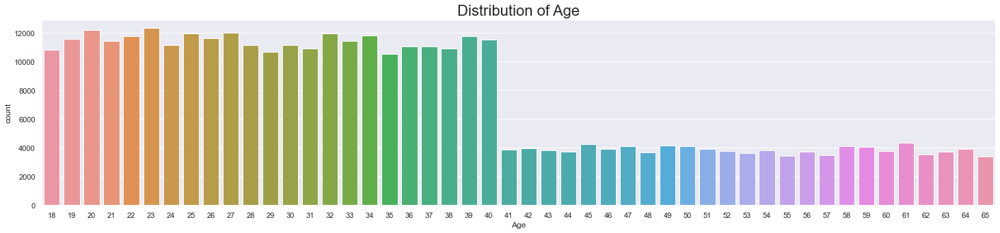

In [716]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Age', data=data)
plt.title('Distribution of Age', fontsize=22)
plt.xlabel('Age')
plt.show()
sns.set(font_scale=2)

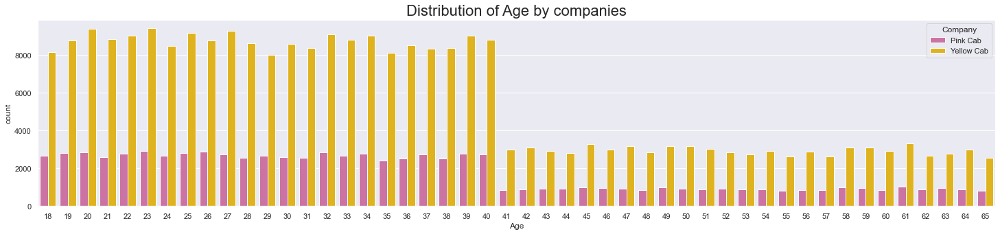

In [717]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Age', hue='Company', data=data, palette = palette)
plt.title('Distribution of Age by companies', fontsize=22)
plt.show()
sns.set(font_scale=2)

The histogram of the age distribution proves the previous graph. Indeed, people under 40 are more likely to use the services of these companies

#### Gender

Look at the gender distribution

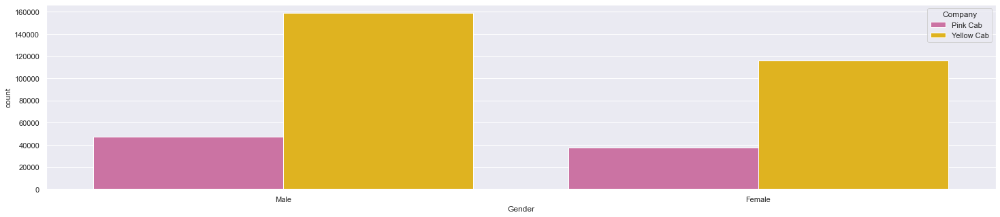

In [333]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Gender', hue='Company', data=data, palette = palette)
plt.show()
sns.set(font_scale=2)

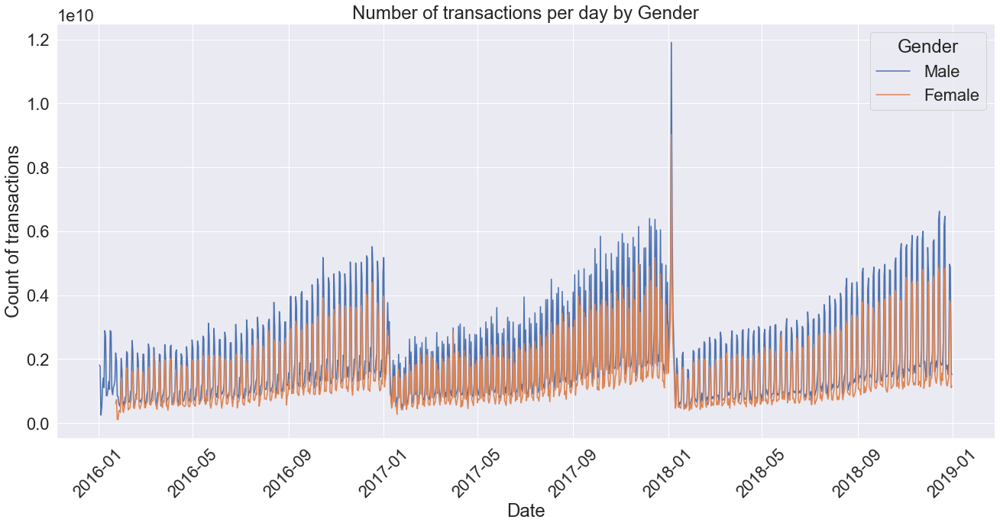

In [718]:
f, axes = plt.subplots(figsize=(22, 10), sharex=True)
ax = sns.lineplot(x="Date of Travel", y="Transaction ID", hue="Gender", data=data, estimator=np.sum)
ax = ax.set(xlabel='Date', ylabel='Count of transactions')
plt.title('Number of transactions per day by Gender')
plt.xticks(rotation=45)
plt.show()

According to the graphs above, we conclude that men use cabs more often, both in general terms and in individual companies

#### Payment_Mode

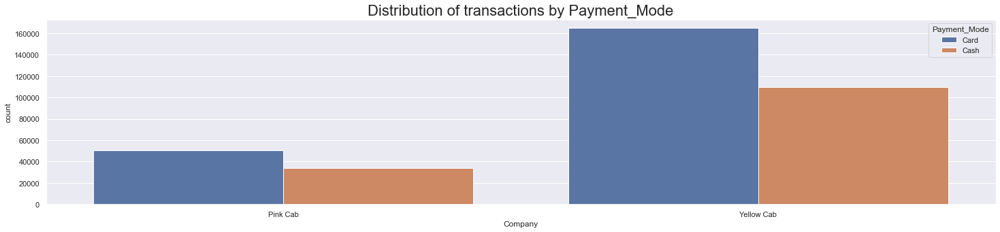

In [719]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Company', hue='Payment_Mode', data=data)
plt.title('Distribution of transactions by Payment_Mode', fontsize=22)
plt.show()
sns.set(font_scale=2)

Obviously, in the modern world of the 21st century, people are more likely to use a bank card to pay for services. Especially considering that the vast majority of our users are young people under 35 - 40 years old.

Datasets by years:

In [541]:
year_2016 = data[data['Year']==2016]
year_2017 = data[data['Year']==2017]
year_2018 = data[data['Year']==2018]

<AxesSubplot:title={'center':'Proportion of Customers by Payment_Mode in 2016'}, ylabel='Company'>

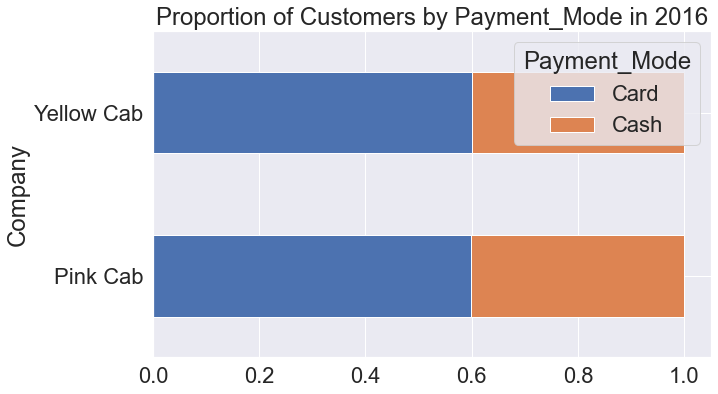

In [542]:
pd.crosstab(year_2016['Company'], columns = year_2016['Payment_Mode'], normalize = 'index').\
plot(kind = 'barh', stacked = True, figsize = (10,6), title = "Proportion of Customers by Payment_Mode in 2016")

<AxesSubplot:title={'center':'Proportion of Customers by Payment_Mode in 2017'}, ylabel='Company'>

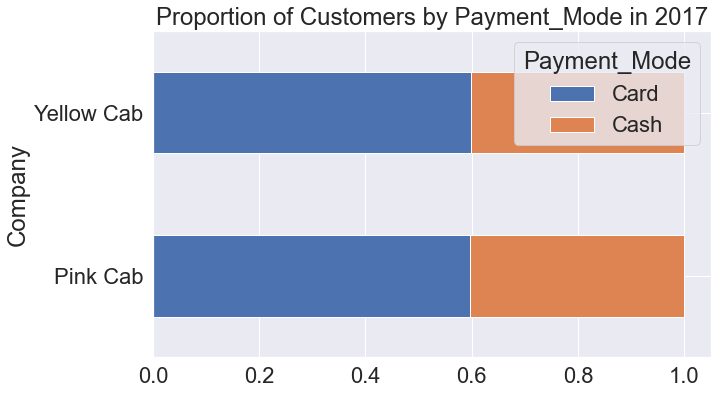

In [543]:
pd.crosstab(year_2017['Company'], columns = year_2017['Payment_Mode'], normalize = 'index').\
plot(kind = 'barh', stacked = True, figsize = (10,6), title = "Proportion of Customers by Payment_Mode in 2017")

<AxesSubplot:title={'center':'Proportion of Customers by Payment_Mode in 2018'}, ylabel='Company'>

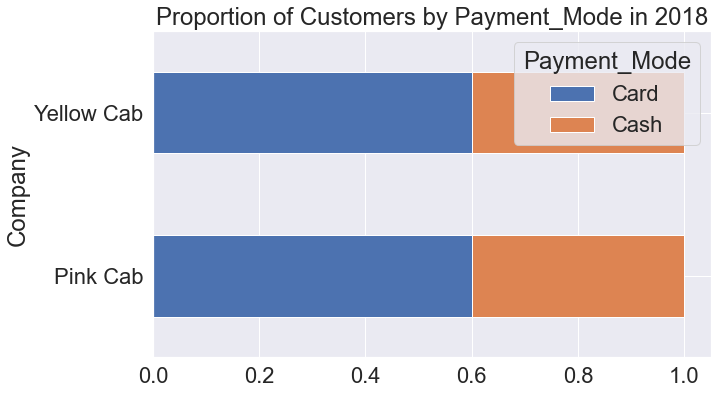

In [544]:
pd.crosstab(year_2018['Company'], columns = year_2018['Payment_Mode'], normalize = 'index').\
plot(kind = 'barh', stacked = True, figsize = (10,6), title = "Proportion of Customers by Payment_Mode in 2018")

<AxesSubplot:title={'center':'Proportion of Customers by Payment_Mode'}, ylabel='Company'>

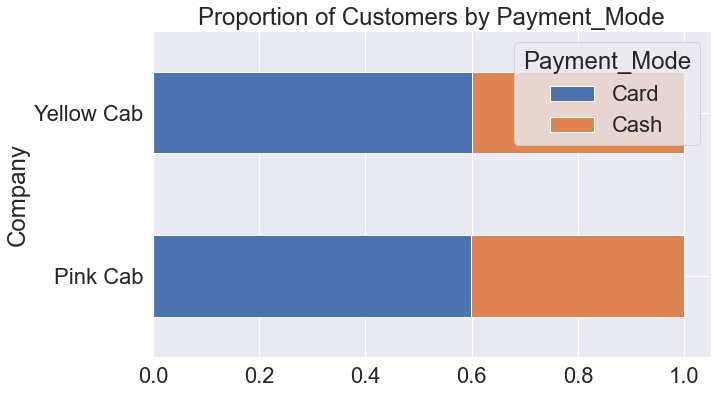

In [534]:
pd.crosstab(data['Company'], columns = data['Payment_Mode'], normalize = 'index').\
plot(kind = 'barh', stacked = True, figsize = (10,6), title = "Proportion of Customers by Payment_Mode")

Each of the companies has the same proportional component according to the methods of fare payment.

Datasets by companies:

In [552]:
yellow_cab = data[data['Company']=='Yellow Cab']
pink_cab = data[data['Company']=='Pink Cab']

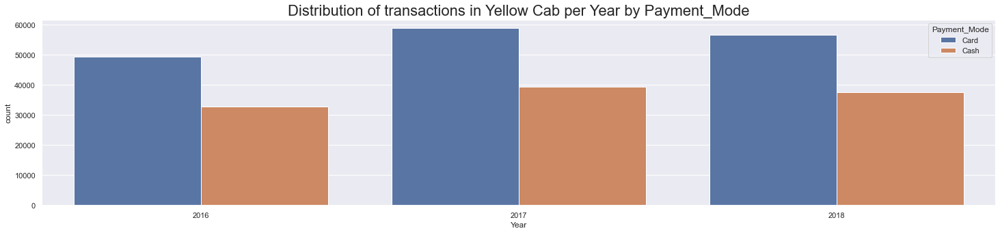

In [721]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Year', hue='Payment_Mode', data=yellow_cab)
plt.title('Distribution of transactions in Yellow Cab per Year by Payment_Mode', fontsize=22)
plt.show()
sns.set(font_scale=2)

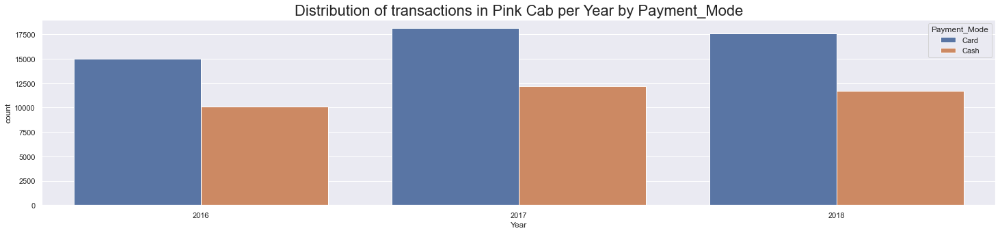

In [722]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Year', hue='Payment_Mode', data=pink_cab)
plt.title('Distribution of transactions in Pink Cab per Year by Payment_Mode', fontsize=22)
plt.show()
sns.set(font_scale=2)

The Yellow Cab company and the Pink Cab company show the same trend in the volume of transactions with different payment methods over the years. Namely, there is an increase by 2017, and a slight drop in 2018, both when paying by card and when paying in cash

#### Price Charged

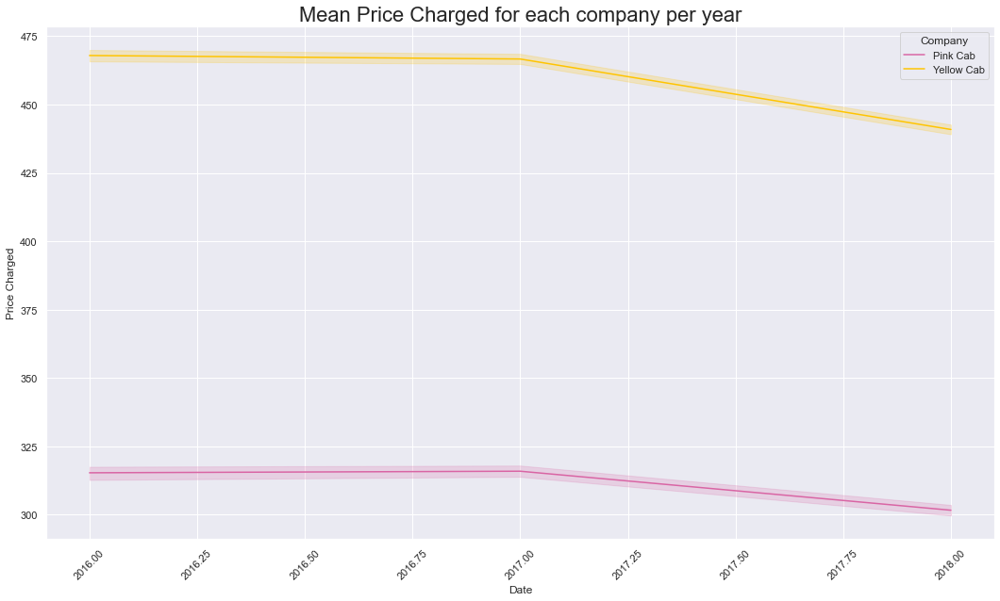

In [443]:
plt.figure(figsize = (18,10))
plt.title('Mean Price Charged for each company per year', fontsize=22)
ax = sns.lineplot(x='Year', y="Price Charged", hue="Company", data=data, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Price Charged')
plt.xticks(rotation=45)
plt.show()

The price of both companies is reduced, but the price reduction of the yellow cab is more drastic. It can be assumed that this is due to a decrease in the company's market share, the emergence of new players in the market, and cab digitalization is taking place.

#### Cost of Trip

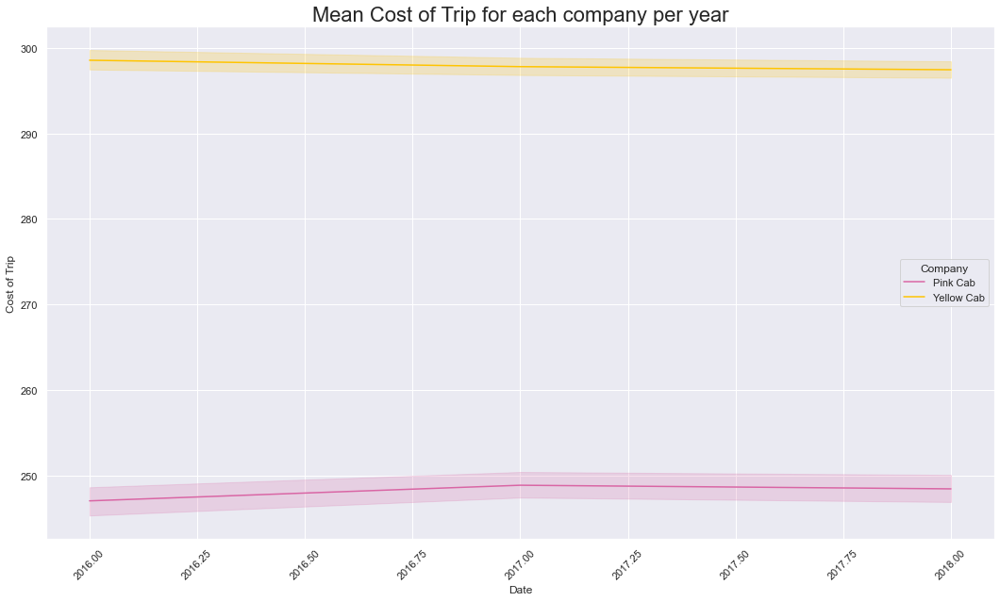

In [442]:
plt.figure(figsize = (18,10))
plt.title('Mean Cost of Trip for each company per year', fontsize=22)
ax = sns.lineplot(x='Year', y="Cost of Trip", hue="Company", data=data, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Cost of Trip')
plt.xticks(rotation=45)
plt.show()

A pink cab increases costs, a yellow cab reduces. The yellow cab finds resources to keep costs down, while the pink cab increases.

#### Customer ID

To create dataset of unique Customer ID:

In [490]:
share_users_year=data[['Year','Company', 'Customer ID']].groupby(['Year','Company']).nunique()

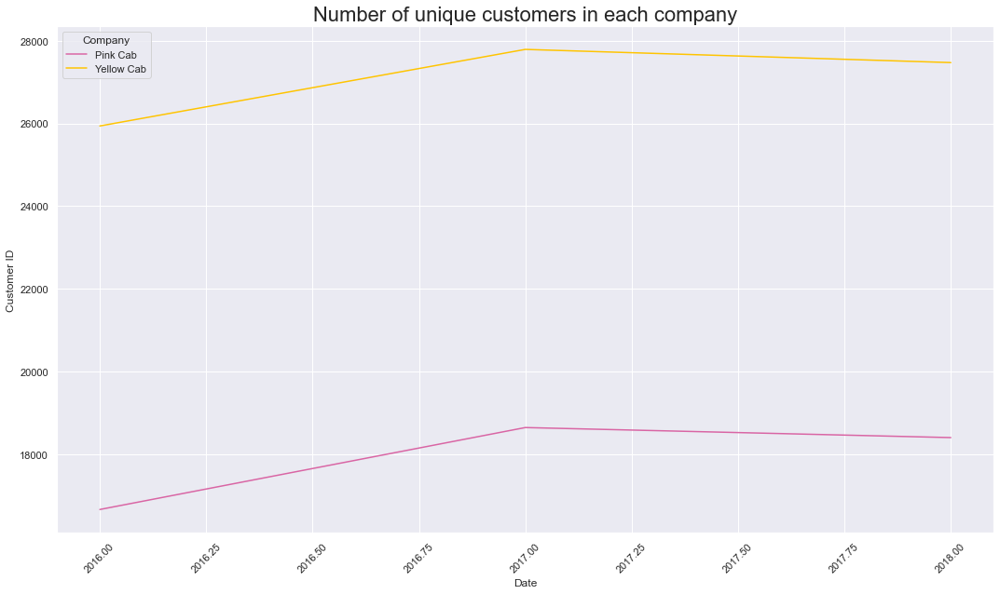

In [494]:
plt.figure(figsize = (18,10))
plt.title('Number of unique customers in each company', fontsize=22)
ax = sns.lineplot(x='Year', y="Customer ID", hue="Company", data=share_users_year, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Customer ID')
plt.xticks(rotation=45)
plt.show()

Creating dataset with information about Price Charged and Cost of Trip for 1 unique customer:

In [491]:
share_users_year_price_cost=data[['Year','Company', 'Price Charged', 'Cost of Trip']].groupby(['Year','Company']).sum()

In [492]:
share_users_year_price_cost_customer = pd.concat([share_users_year_price_cost, share_users_year],axis=1) 

In [499]:
share_users_year_price_cost_customer['Price Charged for 1 unique customer']=share_users_year_price_cost_customer['Price Charged']/share_users_year_price_cost_customer['Customer ID']
share_users_year_price_cost_customer['Cost of Trip for 1 unique customer']=share_users_year_price_cost_customer['Cost of Trip']/share_users_year_price_cost_customer['Customer ID']

In [500]:
share_users_year_price_cost_customer

Price Charged  Cost of Trip  Customer ID  \
Year Company                                                
2016 Pink Cab       7908479.23  6.194968e+06        16661   
     Yellow Cab    38481133.18  2.455414e+07        25937   
2017 Pink Cab       9578629.54  7.544975e+06        18643   
     Yellow Cab    45818910.04  2.924293e+07        27789   
2018 Pink Cab       8841142.56  7.280980e+06        18400   
     Yellow Cab    41553843.97  2.803644e+07        27470   

                 Price Charged for 1 unique customer  \
Year Company                                           
2016 Pink Cab                             474.670142   
     Yellow Cab                          1483.638554   
2017 Pink Cab                             513.792283   
     Yellow Cab                          1648.814640   
2018 Pink Cab                             480.496878   
     Yellow Cab                          1512.699089   

                 Cost of Trip for 1 unique customer  
Year Company                                         
2016 Pink Cab                            371.824501  
     Yellow Cab                          946.683801  
2017 Pink Cab                            404.708182  
     Yellow Cab                         1052.320417  
2018 Pink Cab                            395.705455  
     Yellow Cab                         1020.620466

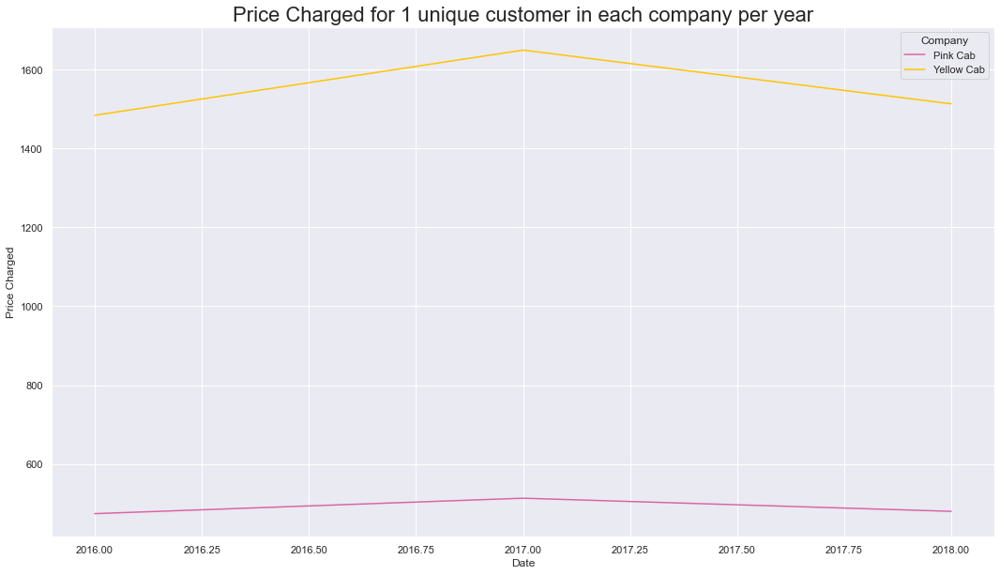

In [503]:
plt.figure(figsize = (18,10))
plt.title('Price Charged for 1 unique customer in each company per year', fontsize=22)
ax = sns.lineplot(x='Year', y="Price Charged for 1 unique customer", hue="Company", data=share_users_year_price_cost_customer, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Price Charged')
plt.show()

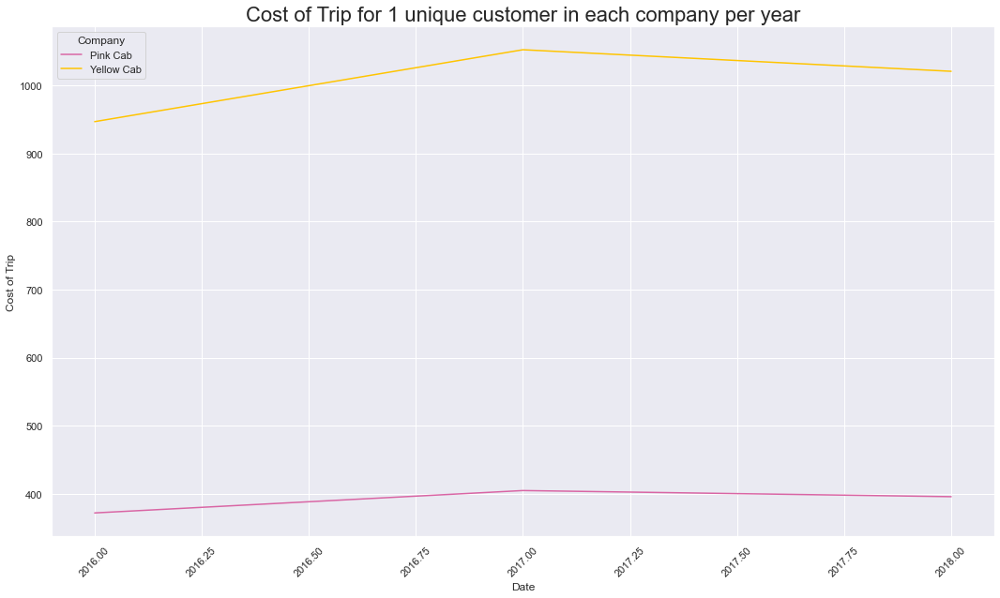

In [504]:
plt.figure(figsize = (18,10))
plt.title('Cost of Trip for 1 unique customer in each company per year', fontsize=22)
ax = sns.lineplot(x='Year', y="Cost of Trip for 1 unique customer", hue="Company", data=share_users_year_price_cost_customer, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Cost of Trip')
plt.xticks(rotation=45)
plt.show()

#### Income

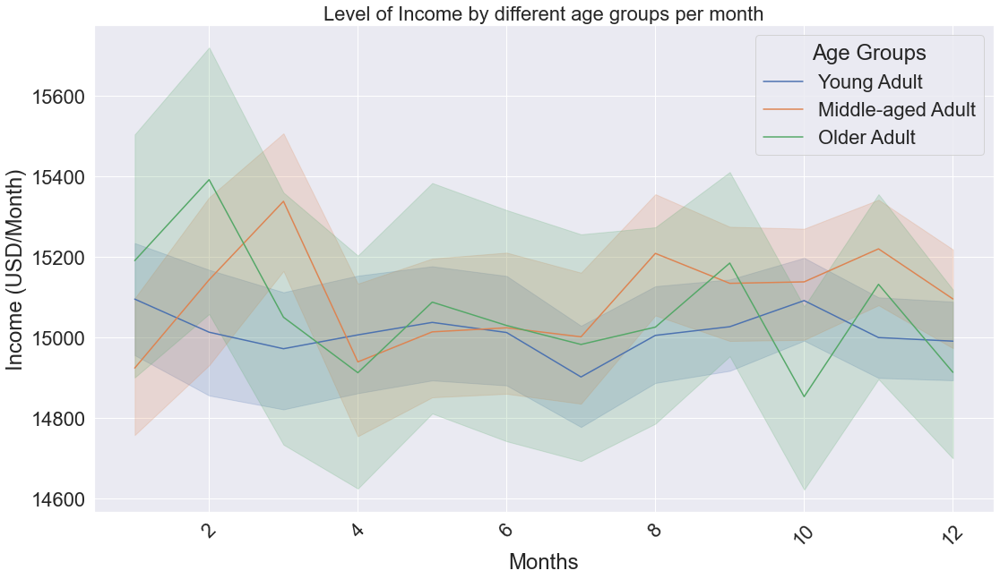

In [808]:
plt.figure(figsize = (18,10))
plt.title('Level of Income by different age groups per month', fontsize=22)
ax = sns.lineplot(x='Month', y="Income (USD/Month)", hue="Age Groups", data=data, estimator=np.mean)
ax = ax.set(xlabel='Months', ylabel='Income (USD/Month)')
plt.xticks(rotation=45)
plt.show()

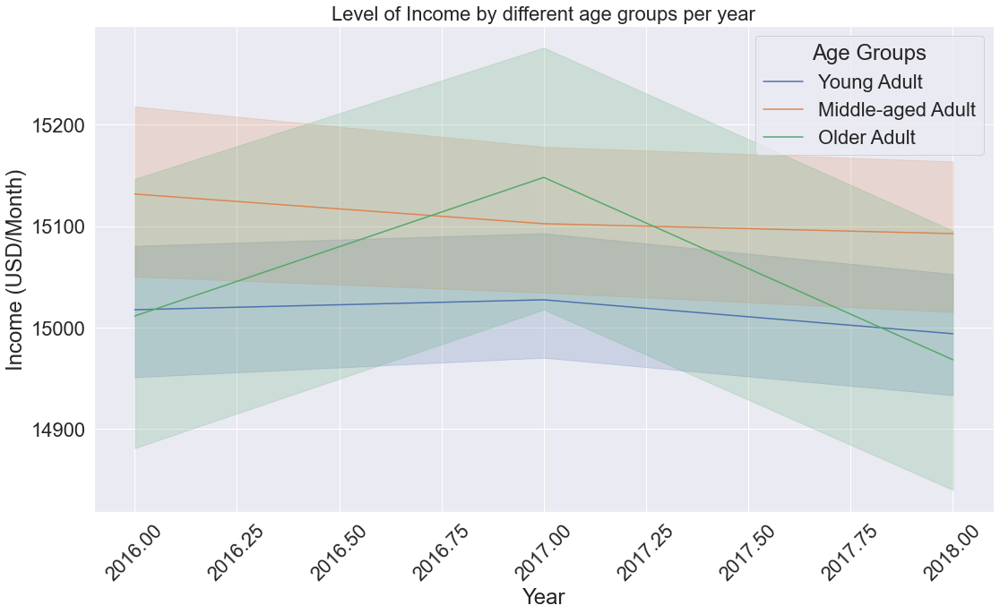

In [775]:
plt.figure(figsize = (18,10))
plt.title('Level of Income by different age groups per year', fontsize=22)
ax = sns.lineplot(x='Year', y="Income (USD/Month)", hue="Age Groups", data=data, estimator=np.mean)
ax = ax.set(xlabel='Year', ylabel='Income (USD/Month)')
plt.xticks(rotation=45)
plt.show()

There is no significant difference between the incomes of users by different ages.

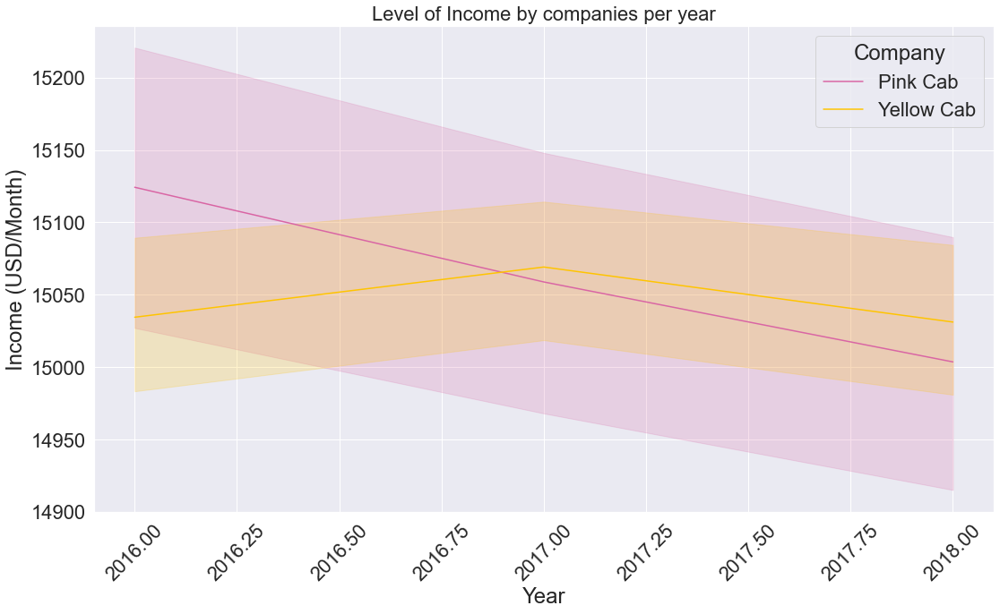

In [777]:
plt.figure(figsize = (18,10))
plt.title('Level of Income by companies per year', fontsize=22)
ax = sns.lineplot(x='Year', y="Income (USD/Month)", hue="Company", data=data, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Year', ylabel='Income (USD/Month)')
plt.xticks(rotation=45)
plt.show()

To create new feature "Income Groups":
- 'Low-middle' - income <5000 USD/Month
- 'Middle' - from 5000 to 9000 USD/Month
- 'Upper-middle' - from 9000 to 20000 USD/Month
- 'High' - more than 20000 USD/Month


In [511]:
data['Income Groups']=data['Income (USD/Month)'].apply(lambda x: 'Low-middle' if x<5000 else 'Middle' if x<9000 else 'Upper-middle' if x<20000 else 'High')

<AxesSubplot:title={'center':'Proportion of Customers by Income Levels'}, ylabel='Company'>

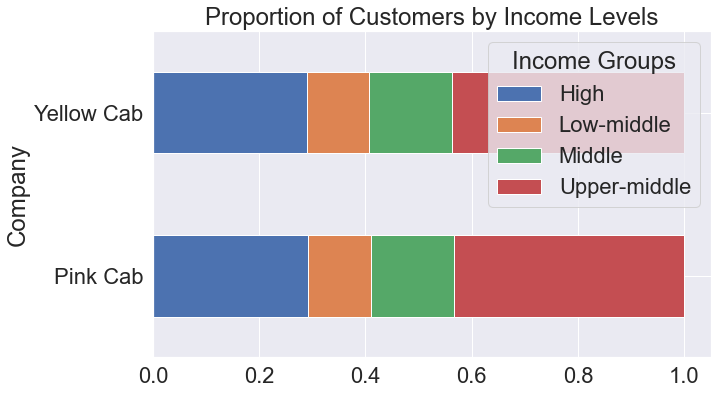

In [516]:
pd.crosstab(data['Company'], columns = data['Income Groups'], normalize = 'index').\
plot(kind = 'barh', stacked = True, figsize = (10,6), title = "Proportion of Customers by Income Levels")

The previous graph explains this one, since the proportions of customer income in the companies are the same, so there is no difference.

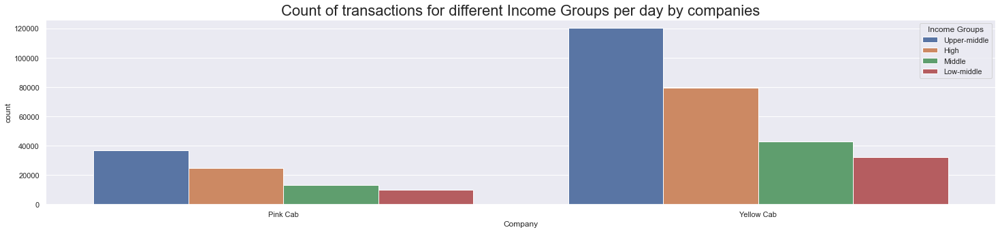

In [807]:
sns.set(font_scale=1)
plt.figure(figsize=(25, 5))
sns.countplot(x='Company', hue='Income Groups', data=data)
plt.title('Count of transactions for different Income Groups per day by companies', fontsize=22)
plt.show()
sns.set(font_scale=2)

<AxesSubplot:title={'center':'Proportion of Customers by Income Levels in different cities'}, ylabel='City'>

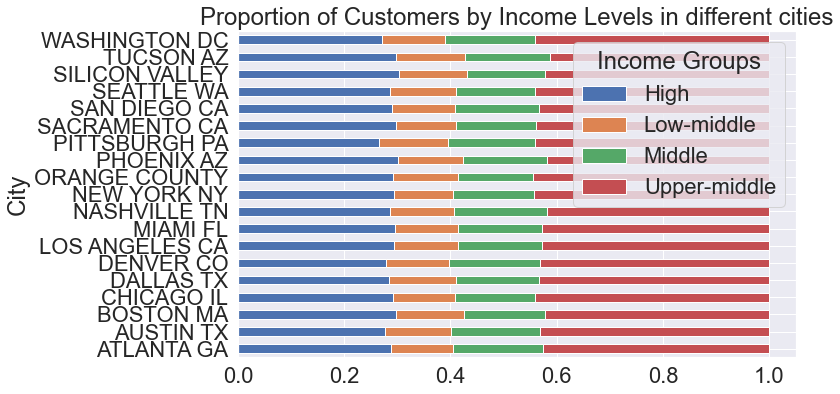

In [519]:
pd.crosstab(data['City'], columns = data['Income Groups'], normalize = 'index').\
plot(kind = 'barh', stacked = True, figsize = (10,6), title = "Proportion of Customers by Income Levels in different cities")

All cities are dominated by high- and upper-middle-income customers.

#### Financial variables

New feature - financial variable 'Efficiency, %', which is calculated using the following formula: (Price Charged - Cost of Trip)/Price Charged.

Efficiency of sales is one of the main financial indicators for evaluating the effectiveness of a company. The ratio shows the ratio of profit from sales to revenue for a certain period. The growth of the indicator indicates that the company is working more efficiently than before. Therefore, this relative indicator was chosen, as it best shows the state of the company.

In [724]:
data['Profit']=data['Price Charged']- data['Cost of Trip']

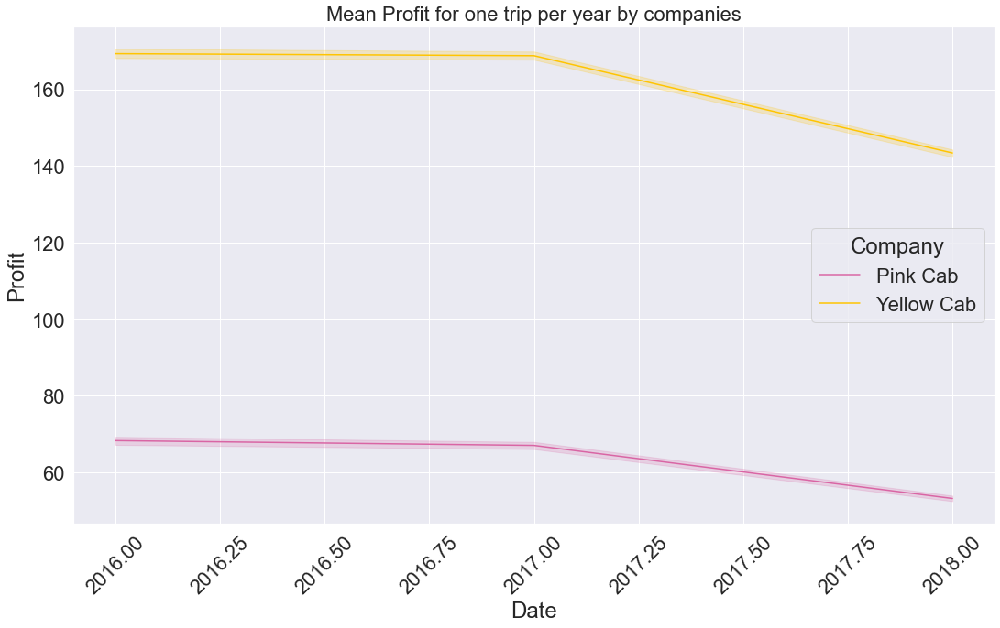

In [774]:
plt.figure(figsize = (18,10))
plt.title('Mean Profit for one trip per year by companies', fontsize=22)
ax = sns.lineplot(x='Year', y="Profit", hue="Company", data=data, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Profit')
plt.xticks(rotation=45)
plt.show()

In [520]:
data['Efficiency, %']=data['Profit']/data['Price Charged']*100

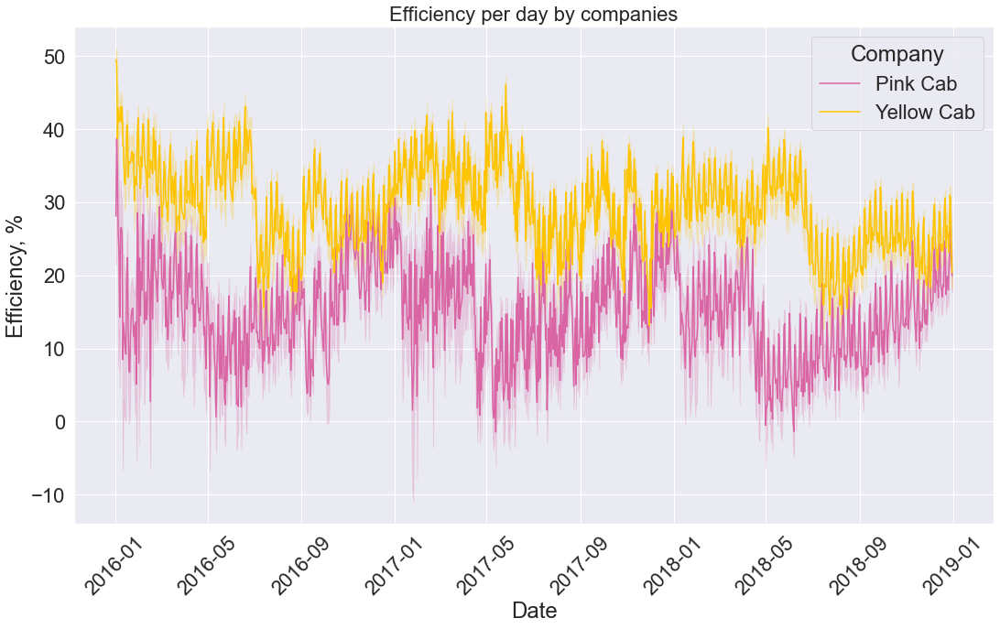

In [726]:
plt.figure(figsize = (18,10))
plt.title('Efficiency per day by companies', fontsize=22)
ax = sns.lineplot(x='Date of Travel', y="Efficiency, %", hue="Company", data=data, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

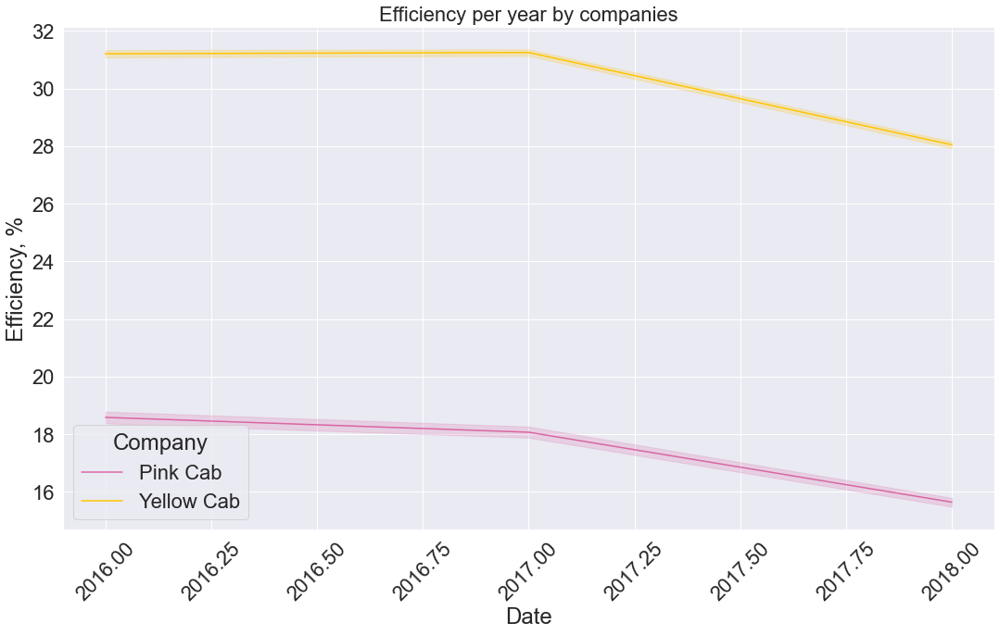

In [727]:
plt.figure(figsize = (18,10))
plt.title('Efficiency per year by companies', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Company", data=data, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

The following conclusion can be drawn under the charts above: in the context of a decrease in the price of a trip for two companies, the efficiency of a yellow cab falls more quickly due to a strong price reduction and a slight cost optimization, which does not leave the profitability at the same level.

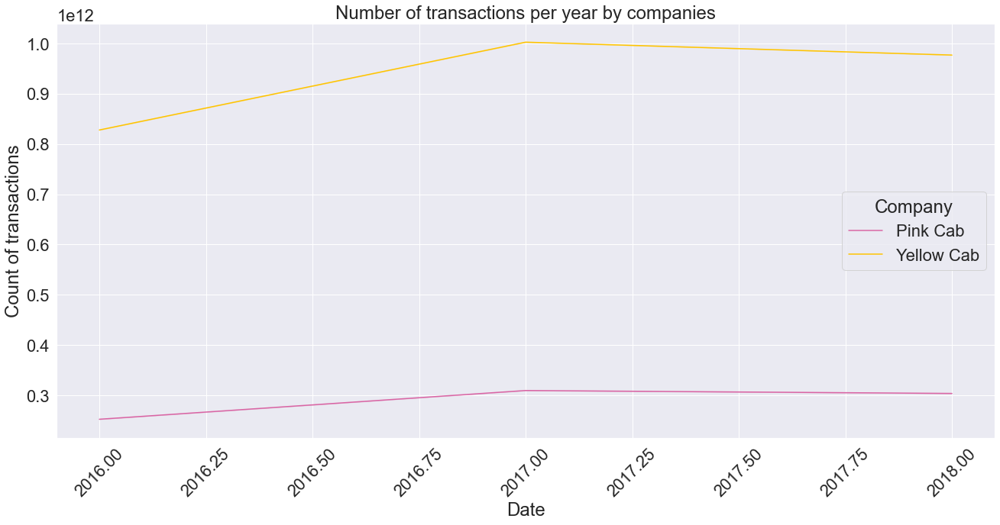

In [737]:
f, axes = plt.subplots(figsize=(22, 10), sharex=True)
ax = sns.lineplot(x="Year", y="Transaction ID", hue="Company", data=data, estimator=np.sum, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Count of transactions')
plt.title('Number of transactions per year by companies')
plt.xticks(rotation=45)
plt.show()

The number of transactions affects the level of efficiency. Therefore, the charts above show that the Yellow Cab has more orders and higher efficiency.

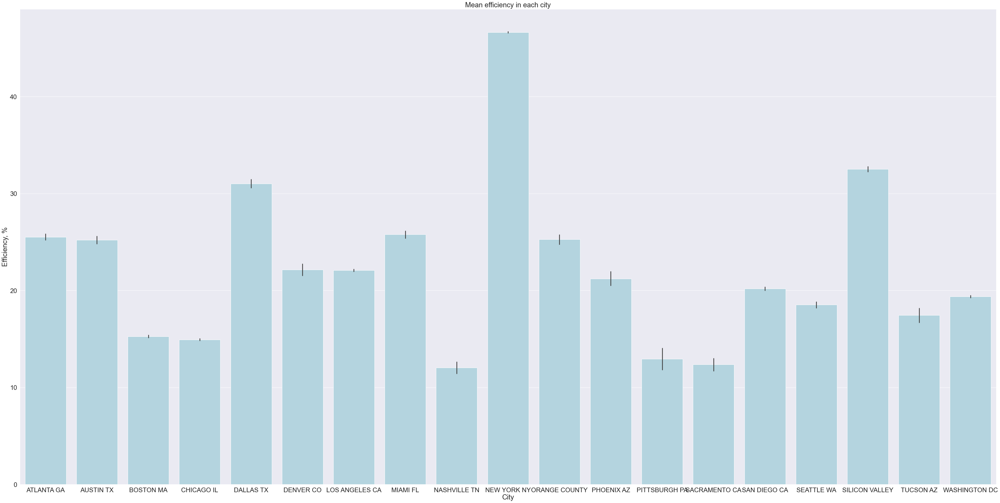

In [532]:
f, axes = plt.subplots(figsize=(60, 30), sharex=True)
ax = sns.barplot(x="City", y="Efficiency, %", data=data, estimator=np.mean, color='lightblue').set_title("Mean efficiency in each city")
plt.show()

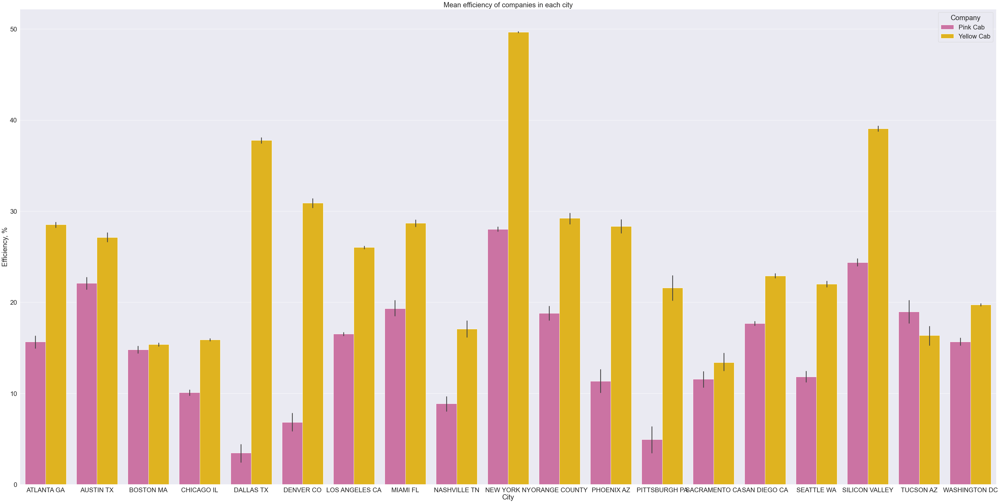

In [533]:
f, axes = plt.subplots(figsize=(60, 30), sharex=True)
ax = sns.barplot(x="City", y="Efficiency, %", hue='Company', data=data, estimator=np.mean, palette = palette).set_title("Mean efficiency of companies in each city")
plt.show()

In general, the efficiency of the Yellow Cab exceeds the efficiency of the Pink one, except for one city. In small towns, you can see that the efficiency of a Pink Cab is approaching or, in the case of Tucson, ahead of a Yellow one. This is due to the fact that the Yellow Cab is more active in larger cities, where there are more active cab users.

Datasets by Payment_Mode:

In [546]:
card = data[data['Payment_Mode']=='Card']
cash = data[data['Payment_Mode']=='Cash']

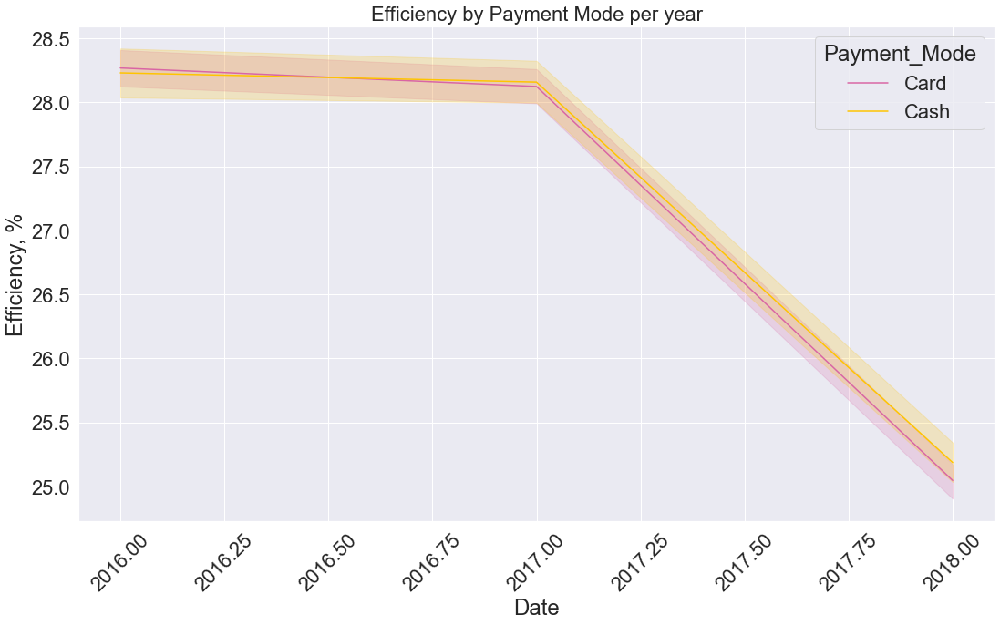

In [772]:
plt.figure(figsize = (18,10))
plt.title('Efficiency by Payment Mode per year', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Payment_Mode", data=data, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

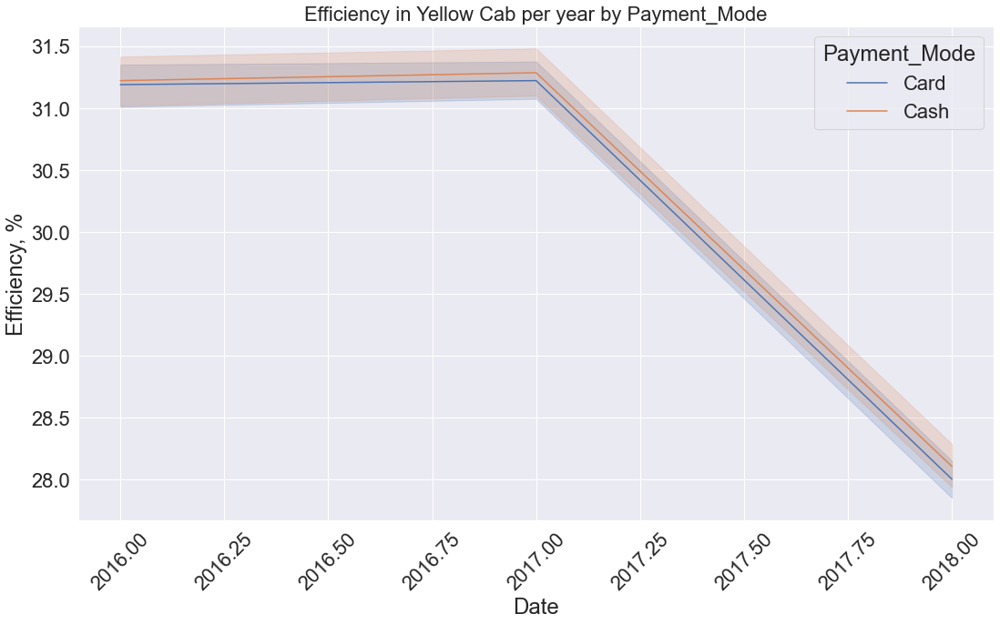

In [769]:
plt.figure(figsize = (18,10))
plt.title('Efficiency in Yellow Cab per year by Payment_Mode', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Payment_Mode", data=yellow_cab, estimator=np.mean)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

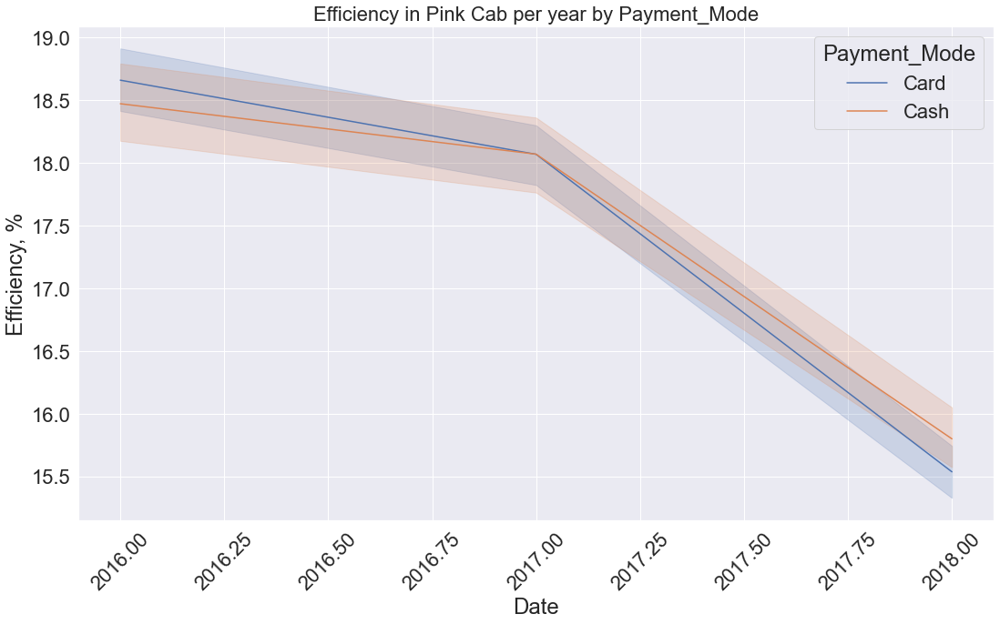

In [771]:
plt.figure(figsize = (18,10))
plt.title('Efficiency in Pink Cab per year by Payment_Mode', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Payment_Mode", data=pink_cab, estimator=np.mean)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

Efficiency when paying by card in all cases is lower than paying in cash, except for 2016 of the Pink Cab company.

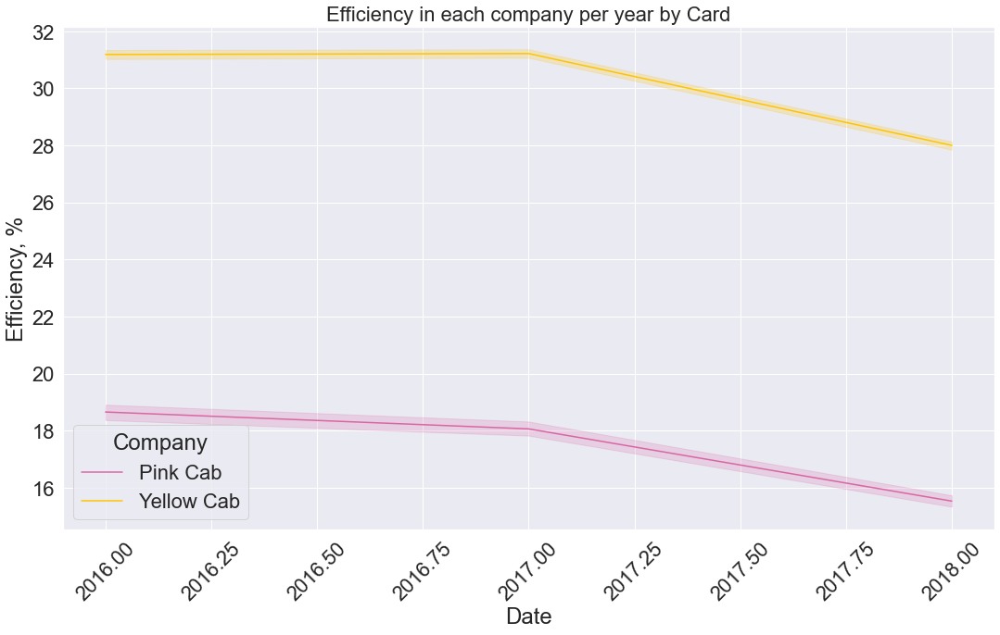

In [550]:
plt.figure(figsize = (18,10))
plt.title('Efficiency in each company per year by Card', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Company", data=card, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

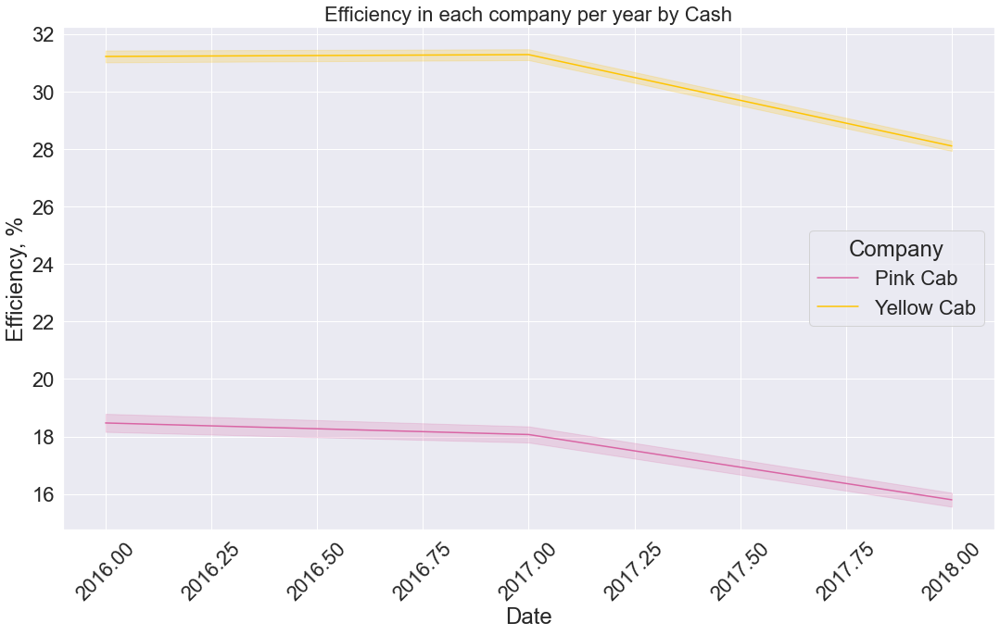

In [551]:
plt.figure(figsize = (18,10))
plt.title('Efficiency in each company per year by Cash', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Company", data=cash, estimator=np.mean, palette = palette)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

To create a table with number of transaction for unique customers:

In [564]:
constant_users=data.groupby(['Year','Company', 'Customer ID'], as_index=False)['Transaction ID'].count()
constant_users

,Year,Company,Customer ID,Transaction ID
0,2016,Pink Cab,1,1
1,2016,Pink Cab,2,2
2,2016,Pink Cab,3,2
3,2016,Pink Cab,5,2
4,2016,Pink Cab,6,1
...,...,...,...,...
134895,2018,Yellow Cab,59996,3
134896,2018,Yellow Cab,59997,4
134897,2018,Yellow Cab,59998,2
134898,2018,Yellow Cab,59999,4


In [574]:
constant_users.describe()

,Year,Customer ID,Transaction ID
count,134900.000000,134900.000000,134900.000000
mean,2017.024255,24028.910371,2.664136
std,0.809457,19638.629824,2.637607
min,2016.000000,1.000000,1.000000
25%,2016.000000,6520.000000,1.000000
50%,2017.000000,19080.000000,2.000000
75%,2018.000000,38325.250000,3.000000
max,2018.000000,60000.000000,25.000000


In [575]:
y_cab=constant_users[constant_users['Company']=='Yellow Cab']
p_cab=constant_users[constant_users['Company']=='Pink Cab']

In [587]:
less_than_5=y_cab[y_cab['Transaction ID']<5]
from_5_to_10=y_cab[(y_cab['Transaction ID']>=5) & (y_cab['Transaction ID']<10)]
from_10_to_15=y_cab[(y_cab['Transaction ID']>=10) & (y_cab['Transaction ID']<15)]
more_than_15=y_cab[y_cab['Transaction ID']>=15]

In [588]:
less_than_5

,Year,Company,Customer ID,Transaction ID
16684,2016,Yellow Cab,24,3
16700,2016,Yellow Cab,40,4
16708,2016,Yellow Cab,48,3
16728,2016,Yellow Cab,68,3
16737,2016,Yellow Cab,77,4
...,...,...,...,...
134894,2018,Yellow Cab,59995,4
134895,2018,Yellow Cab,59996,3
134896,2018,Yellow Cab,59997,4
134897,2018,Yellow Cab,59998,2


In [589]:
from_5_to_10

,Year,Company,Customer ID,Transaction ID
16661,2016,Yellow Cab,1,8
16664,2016,Yellow Cab,4,9
16665,2016,Yellow Cab,5,5
16668,2016,Yellow Cab,8,6
16670,2016,Yellow Cab,10,8
...,...,...,...,...
134889,2018,Yellow Cab,59990,6
134890,2018,Yellow Cab,59991,6
134891,2018,Yellow Cab,59992,6
134892,2018,Yellow Cab,59993,5


In [590]:
from_10_to_15

,Year,Company,Customer ID,Transaction ID
16662,2016,Yellow Cab,2,11
16663,2016,Yellow Cab,3,13
16666,2016,Yellow Cab,6,12
16667,2016,Yellow Cab,7,12
16669,2016,Yellow Cab,9,12
...,...,...,...,...
131490,2018,Yellow Cab,53786,11
131496,2018,Yellow Cab,53792,12
131523,2018,Yellow Cab,53820,12
132686,2018,Yellow Cab,57639,11


In [591]:
more_than_15

,Year,Company,Customer ID,Transaction ID
16707,2016,Yellow Cab,47,15
16732,2016,Yellow Cab,72,15
16845,2016,Yellow Cab,185,15
16852,2016,Yellow Cab,192,15
16931,2016,Yellow Cab,271,15
...,...,...,...,...
111108,2018,Yellow Cab,3680,17
111659,2018,Yellow Cab,4232,15
112141,2018,Yellow Cab,4717,16
112263,2018,Yellow Cab,4840,15


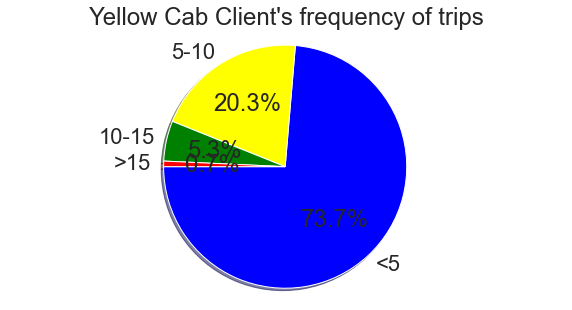

In [592]:
vals=[59808, 16452, 4340, 596]
labels = ["<5", "5-10", "10-15",">15"]
colors = ['blue','yellow','green', 'red']
plt.title("Yellow Cab Client's frequency of trips")
plt.pie(vals,labels=labels,colors=colors,shadow=True,autopct='%1.1f%%',startangle=180)
plt.axis('equal')
plt.show()

In [593]:
less_than_5=p_cab[p_cab['Transaction ID']<5]
from_5_to_10=p_cab[(p_cab['Transaction ID']>=5) & (p_cab['Transaction ID']<10)]
from_10_to_15=p_cab[(p_cab['Transaction ID']>=10) & (p_cab['Transaction ID']<15)]
more_than_15=p_cab[p_cab['Transaction ID']>=15]

In [594]:
less_than_5

,Year,Company,Customer ID,Transaction ID
0,2016,Pink Cab,1,1
1,2016,Pink Cab,2,2
2,2016,Pink Cab,3,2
3,2016,Pink Cab,5,2
4,2016,Pink Cab,6,1
...,...,...,...,...
107425,2018,Pink Cab,59995,1
107426,2018,Pink Cab,59997,1
107427,2018,Pink Cab,59998,2
107428,2018,Pink Cab,59999,2


In [595]:
from_5_to_10

,Year,Company,Customer ID,Transaction ID
20,2016,Pink Cab,27,6
41,2016,Pink Cab,51,5
71,2016,Pink Cab,89,5
115,2016,Pink Cab,149,5
187,2016,Pink Cab,243,5
...,...,...,...,...
100126,2018,Pink Cab,20587,6
100173,2018,Pink Cab,20666,5
100253,2018,Pink Cab,20786,6
100287,2018,Pink Cab,20832,6


In [596]:
from_10_to_15

,Year,Company,Customer ID,Transaction ID
4416,2016,Pink Cab,6416,10
47251,2017,Pink Cab,6237,10
49161,2017,Pink Cab,8345,12
49385,2017,Pink Cab,8595,13


In [597]:
more_than_15

,Year,Company,Customer ID,Transaction ID


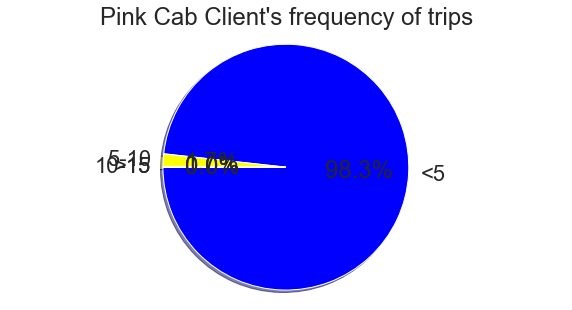

In [598]:
vals=[52774, 926, 4, 0]
labels = ["<5", "5-10", "10-15",">15"]
colors = ['blue','yellow','green', 'red']
plt.title("Pink Cab Client's frequency of trips")
plt.pie(vals,labels=labels,colors=colors,shadow=True,autopct='%1.1f%%',startangle=180)
plt.axis('equal')
plt.show()

#### Efficiency by number of transactions

In [615]:
efficiency_by_transactions=data.groupby(['Year','Company', 'Customer ID'], as_index=False)['Efficiency, %'].mean()
efficiency_by_transactions

,Year,Company,Customer ID,"Efficiency, %"
0,2016,Pink Cab,1,34.870358
1,2016,Pink Cab,2,35.425322
2,2016,Pink Cab,3,9.638257
3,2016,Pink Cab,5,13.470373
4,2016,Pink Cab,6,6.994620
...,...,...,...,...
134895,2018,Yellow Cab,59996,-5.546400
134896,2018,Yellow Cab,59997,2.280036
134897,2018,Yellow Cab,59998,22.393759
134898,2018,Yellow Cab,59999,14.774296


In [622]:
efficiency_by_transactions_for_constant_users = pd.concat([constant_users, efficiency_by_transactions],axis=1) 

In [628]:
final=efficiency_by_transactions_for_constant_users.T.drop_duplicates().T

In [663]:
final['Transaction ID']=final['Transaction ID'].astype(int)

In [700]:
final['Transaction Groups']=final['Transaction ID'].apply(lambda x: '<5' if x<5 else '5-9' if x>=5 and x<=9 else '10-15' if x>=10 and x<=15 else '>15')

In [701]:
final

,Year,Company,Customer ID,Transaction ID,"Efficiency, %",Transaction Groups
0,2016,Pink Cab,1,1,34.870358,<5
1,2016,Pink Cab,2,2,35.425322,<5
2,2016,Pink Cab,3,2,9.638257,<5
3,2016,Pink Cab,5,2,13.470373,<5
4,2016,Pink Cab,6,1,6.994620,<5
...,...,...,...,...,...,...
134895,2018,Yellow Cab,59996,3,-5.546400,<5
134896,2018,Yellow Cab,59997,4,2.280036,<5
134897,2018,Yellow Cab,59998,2,22.393759,<5
134898,2018,Yellow Cab,59999,4,14.774296,<5


In [702]:
final['Efficiency, %']=final['Efficiency, %'].astype(float)

In [704]:
y_cab=final[final['Company']=='Yellow Cab']
p_cab=final[final['Company']=='Pink Cab']

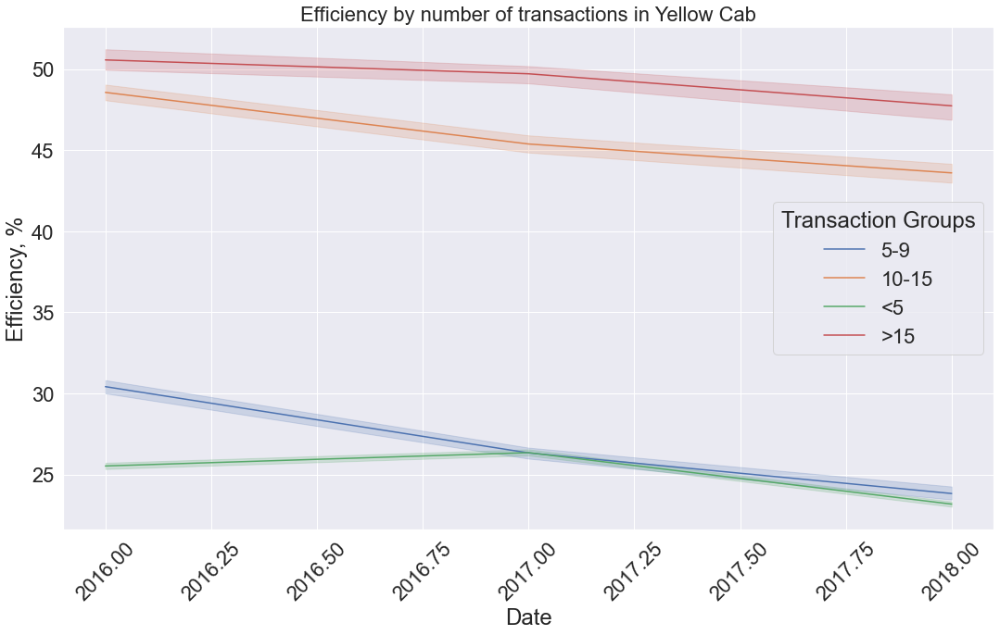

In [706]:
plt.figure(figsize = (18,10))
plt.title('Efficiency by number of transactions in Yellow Cab', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Transaction Groups", data=y_cab, estimator=np.mean)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

Groups with the most trips prevail.

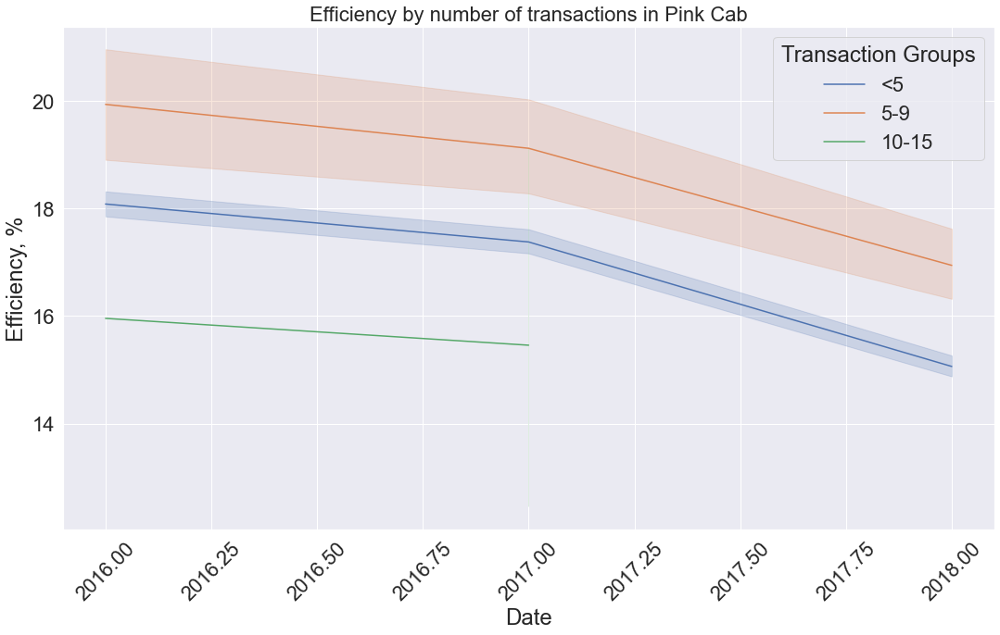

In [707]:
plt.figure(figsize = (18,10))
plt.title('Efficiency by number of transactions in Pink Cab', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Transaction Groups", data=p_cab, estimator=np.mean)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

No customers with count of trip more than 15 in Pink Cab company. Moreover, no one with trips more than 10 after 2017 year.

#### Efficiency by level of income

In [779]:
income_by_unique_customer=data.groupby(['Year','Company', 'Customer ID'], as_index=False)['Income (USD/Month)'].mean()
income_by_unique_customer

,Year,Company,Customer ID,Income (USD/Month)
0,2016,Pink Cab,1,16359
1,2016,Pink Cab,2,12069
2,2016,Pink Cab,3,12968
3,2016,Pink Cab,5,9965
4,2016,Pink Cab,6,4232
...,...,...,...,...
134895,2018,Yellow Cab,59996,16634
134896,2018,Yellow Cab,59997,22352
134897,2018,Yellow Cab,59998,5678
134898,2018,Yellow Cab,59999,24577


In [780]:
efficiency_and_income_by_unique_customer = pd.concat([efficiency_by_transactions, income_by_unique_customer],axis=1) 

In [782]:
final_income=efficiency_and_income_by_unique_customer.T.drop_duplicates().T

In [785]:
final_income['Income (USD/Month)']=final_income['Income (USD/Month)'].astype(int)
final_income['Efficiency, %']=final_income['Efficiency, %'].astype(float)

In [786]:
final_income.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 134900 entries, 0 to 134899
Data columns (total 5 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   Year                134900 non-null  object 
 1   Company             134900 non-null  object 
 2   Customer ID         134900 non-null  object 
 3   Efficiency, %       134900 non-null  float64
 4   Income (USD/Month)  134900 non-null  int32  
dtypes: float64(1), int32(1), object(3)
memory usage: 9.7+ MB


In [787]:
final_income['Income Groups']=final_income['Income (USD/Month)'].apply(lambda x: 'Low-middle' if x<5000 else 'Middle' if x<9000 else 'Upper-middle' if x<20000 else 'High')

In [789]:
y_cab=final_income[final_income['Company']=='Yellow Cab']
p_cab=final_income[final_income['Company']=='Pink Cab']

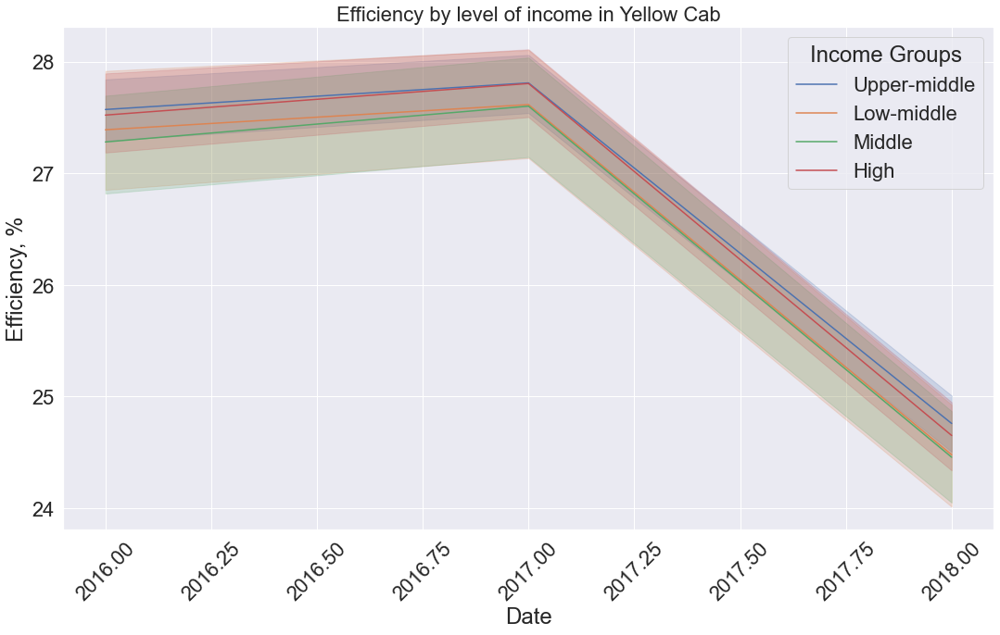

In [790]:
plt.figure(figsize = (18,10))
plt.title('Efficiency by level of income in Yellow Cab', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Income Groups", data=y_cab, estimator=np.mean)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

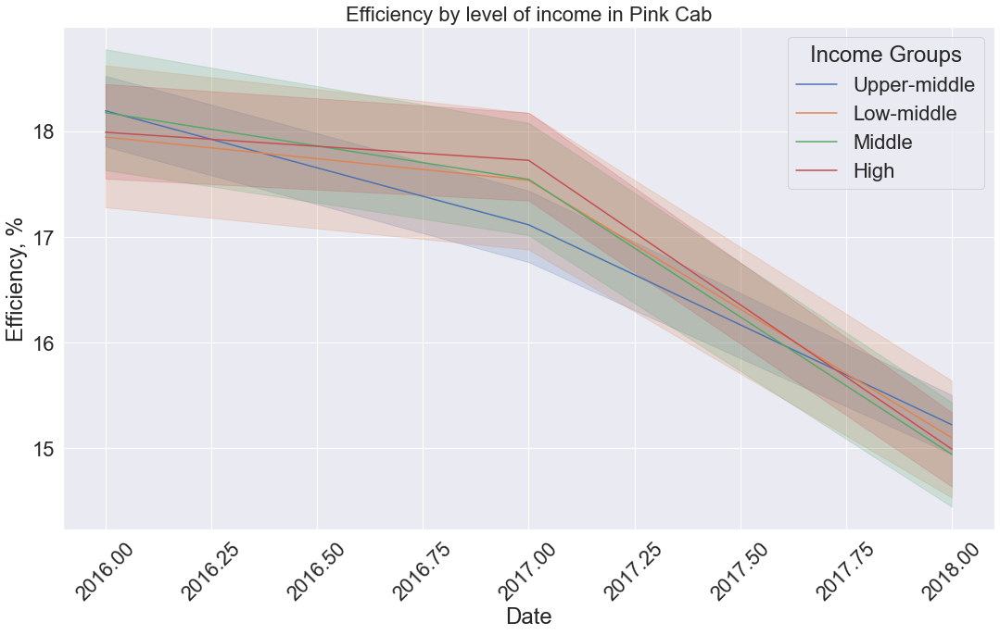

In [792]:
plt.figure(figsize = (18,10))
plt.title('Efficiency by level of income in Pink Cab', fontsize=22)
ax = sns.lineplot(x='Year', y="Efficiency, %", hue="Income Groups", data=p_cab, estimator=np.mean)
ax = ax.set(xlabel='Date', ylabel='Efficiency, %')
plt.xticks(rotation=45)
plt.show()

## Additional dataset

Source link: https://www.numbeo.com/cost-of-living/city_price_rankings?displayCurrency=USD&itemId=105&region=019

According to the data from the website, a new dataset was compiled with information on the average income for each city.

In [800]:
income = pd.read_csv(".\Income.csv", sep=';')
income

,City,Income
0,NEW YORK NY,6274
1,CHICAGO IL,4818
2,LOS ANGELES CA,5625
3,MIAMI FL,4334
4,SILICON VALLEY,8222
5,ORANGE COUNTY,5625
6,SAN DIEGO CA,6026
7,PHOENIX AZ,4601
8,DALLAS TX,5463
9,ATLANTA GA,4822


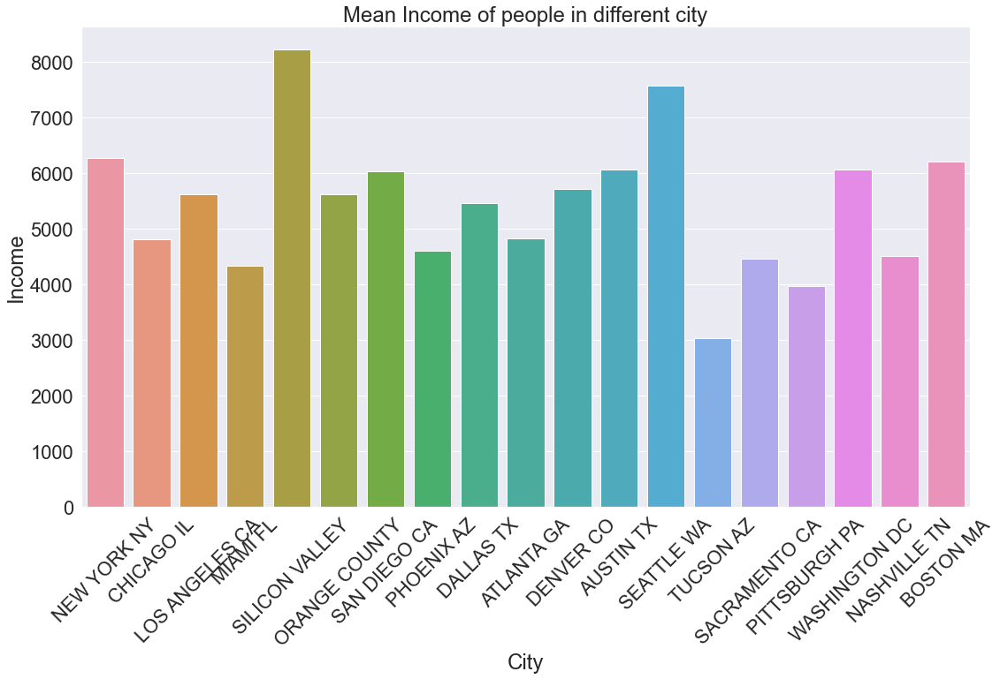

In [806]:
plt.figure(figsize = (18,10))
plt.title('Mean Income of people in different city', fontsize=24)
ax = sns.barplot(x='City', y='Income', data=income)
ax = ax.set(xlabel='City', ylabel='Income')
plt.xticks(rotation=45)
plt.show() 

## Hypothesis results

- Hypothesis No.1: The more transactions a company has, the higher its efficiency.

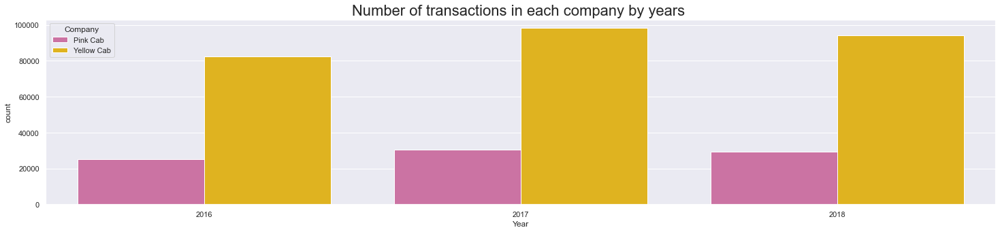


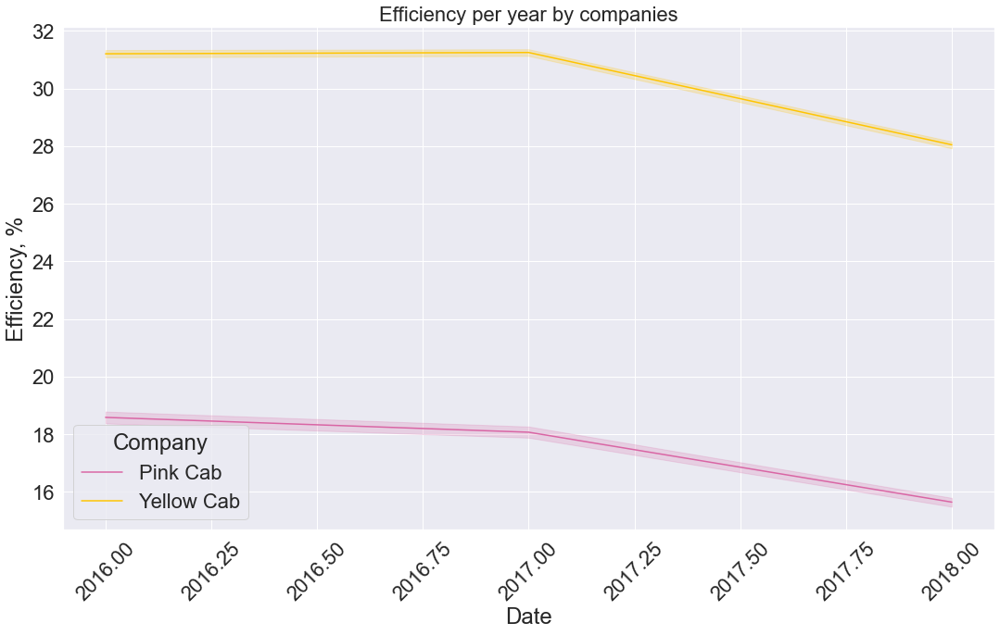

Result: The hypothesis is confirmed. 

The graphs show that the Yellow Cab company has several times more transactions, and the second graph clearly shows that the efficiency of the Yellow Cab is higher than the Pink one.

- Hypothesis No.2: The more unique customers a company has, the higher its efficiency.

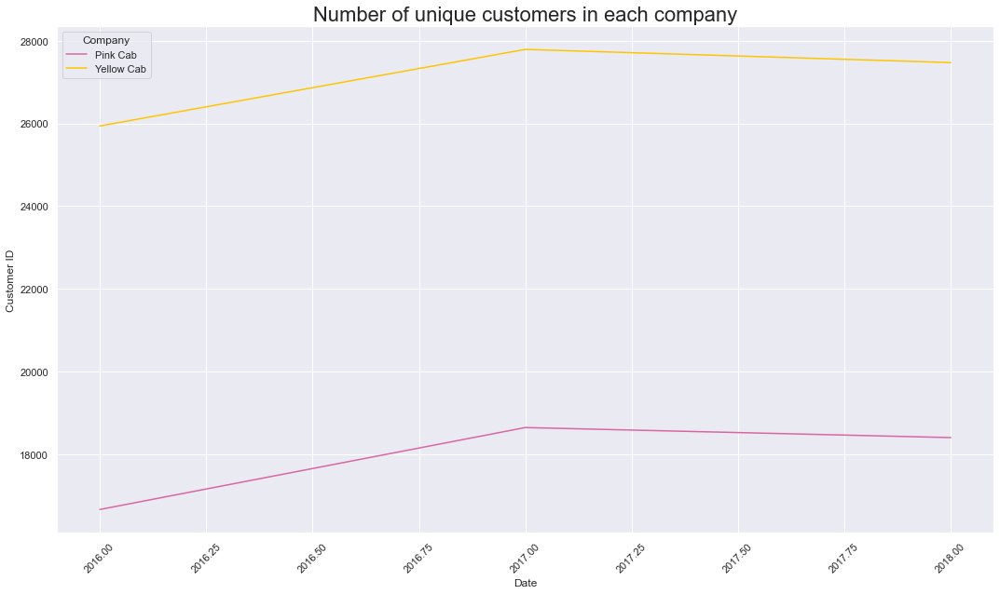
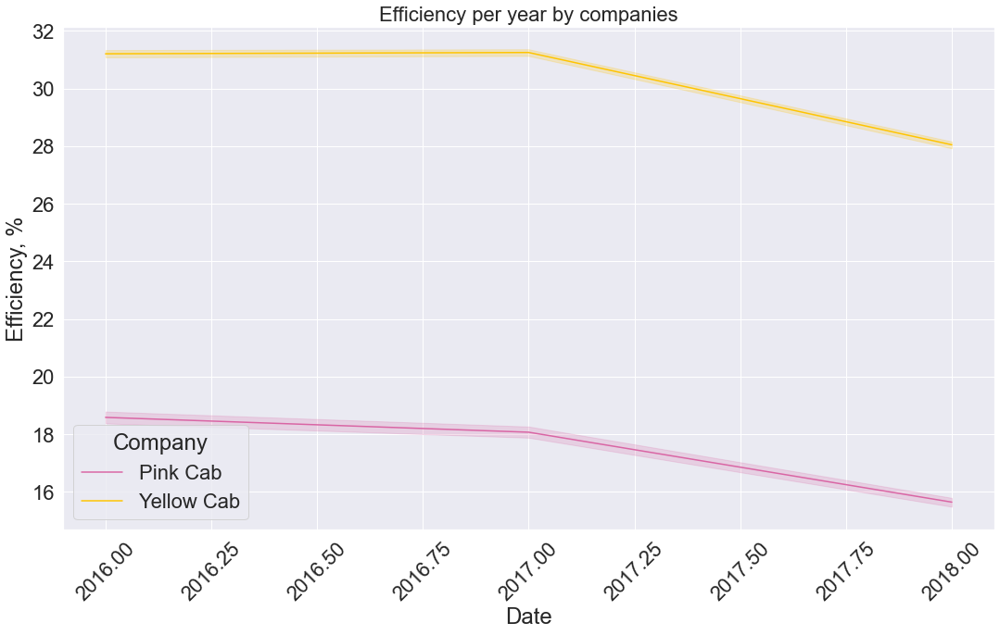

Result: The hypothesis is confirmed.

Yellow Cab has more unique customers and is higher efficiency.

- Hypothesis No.3: The larger the company's revenue, the higher its efficiency.

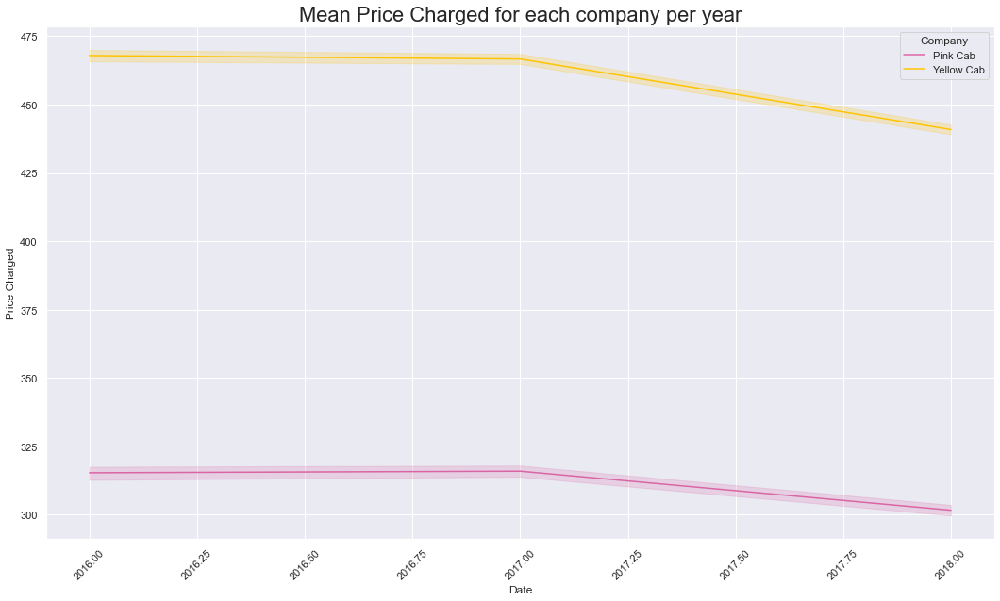
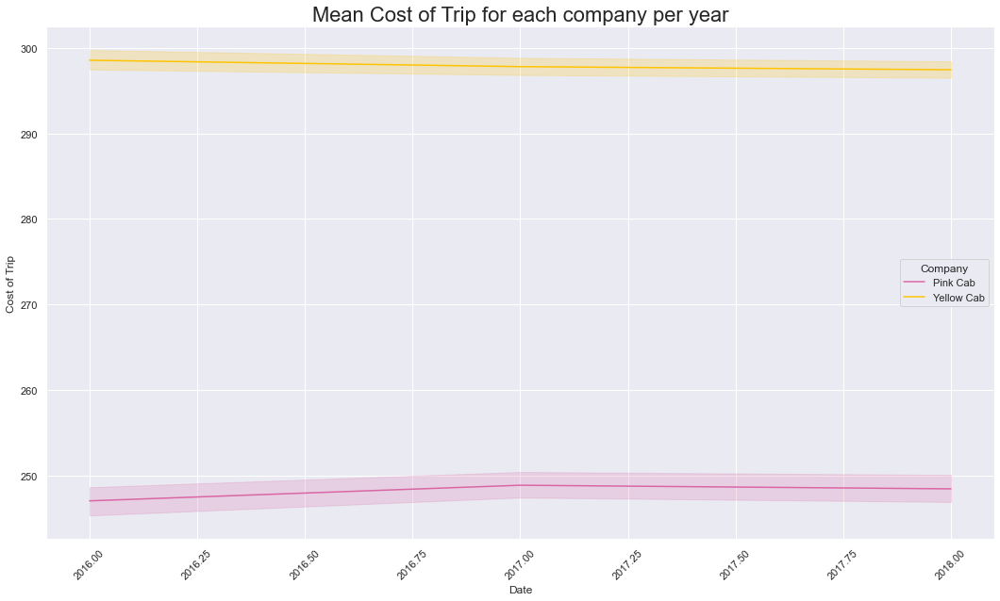
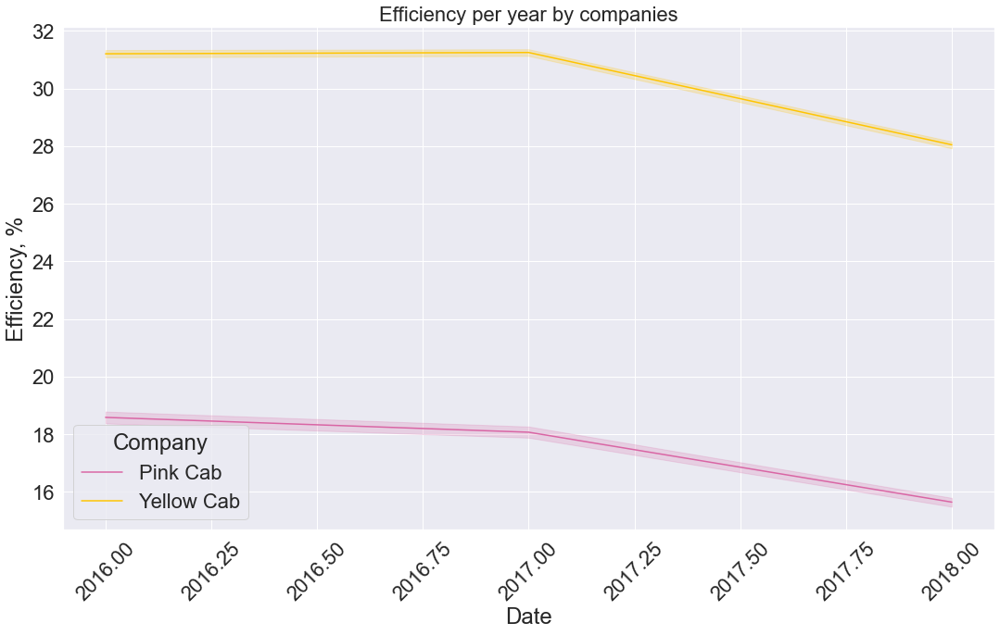

Result: The hypothesis is confirmed.

The components of efficiency are the company's income and travel expenses. According to the 3 graphs, it can be seen that income and efficiency behave in the same way, since the cost curve for companies is less volatile.

- Hypothesis No.4: The more transactions a company has in a particular city, the higher its efficiency in that city relative to another company.

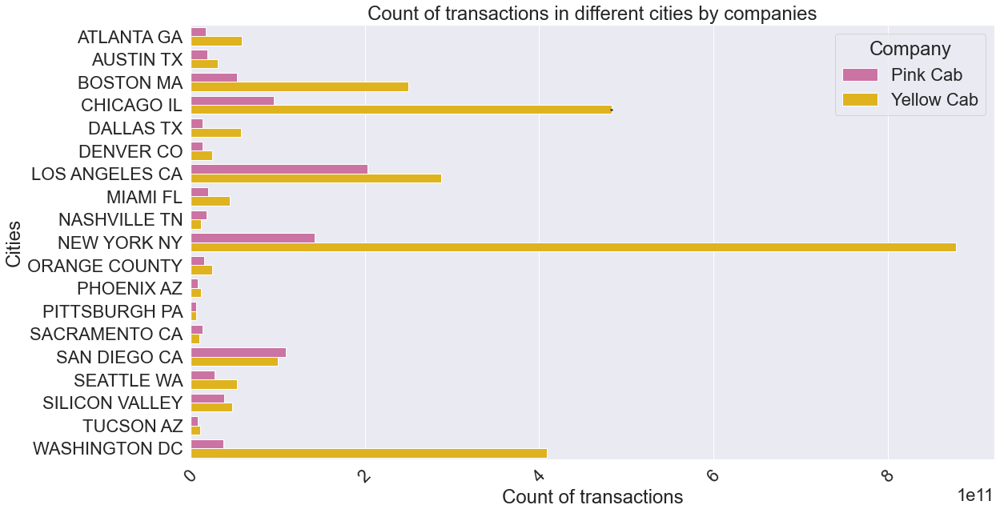
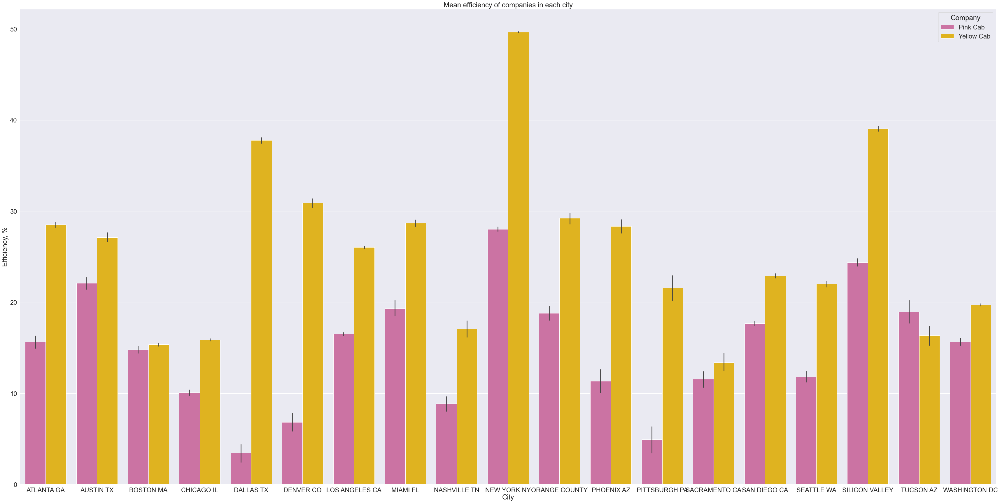

Result: The hypothesis is rejected.

The graphs show that there are cities in which companies have very high efficiency, but they do not have very many transactions. And cities where a lot of trips take place are far from being in the forefront in terms of efficiency. The only exception is New York, as it is the most populated city in the United States.

- Hypothesis No.5: The larger the population of a city, the more trips there are.

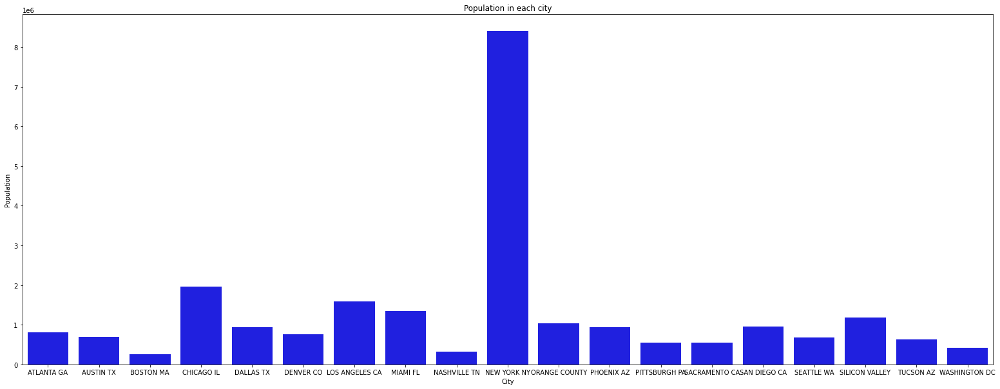
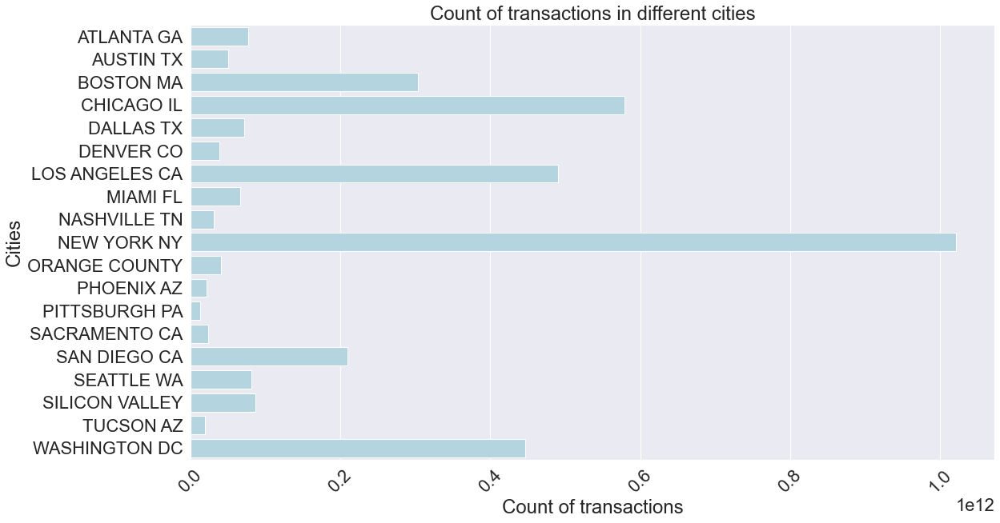
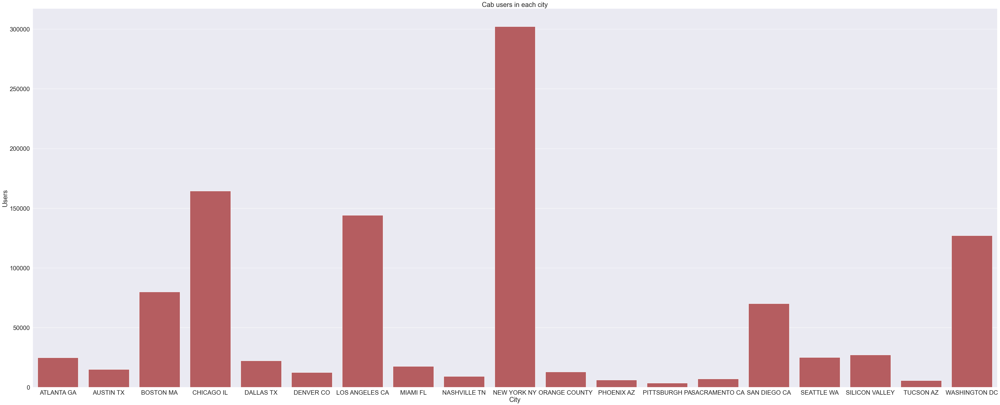

Result: The hypothesis is rejected.
    
Miami and Silicon Valley have high population figures, however, the number of transactions is low. On the other hand, Boston and Washington, which are in the top five in terms of the number of trips, are the least populated cities in America compared to the others in this row. However, New York, Chicago and Los Angeles follow the trend in this hypothesis, but these are only exceptions to the rule, judging by the chart. 

In addition, looking at the 3rd graph, the best relationship can be found between the number of cab users in total by city and the number of transactions.

- Hypothesis No.6: The larger the population of the city, the higher the efficiency.

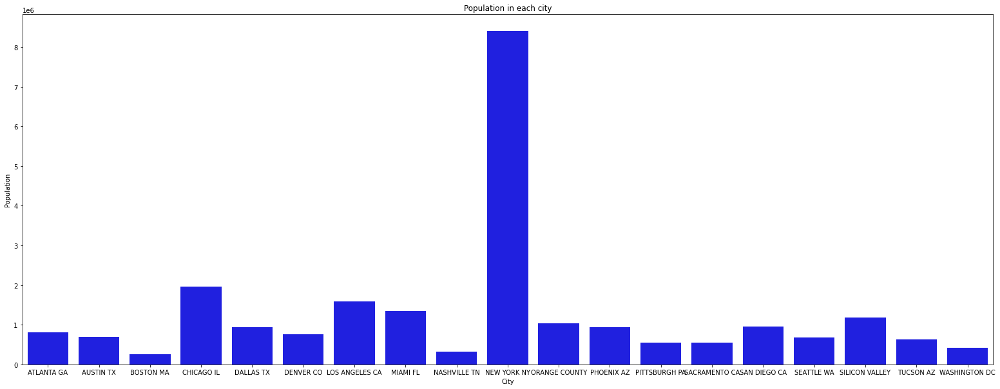
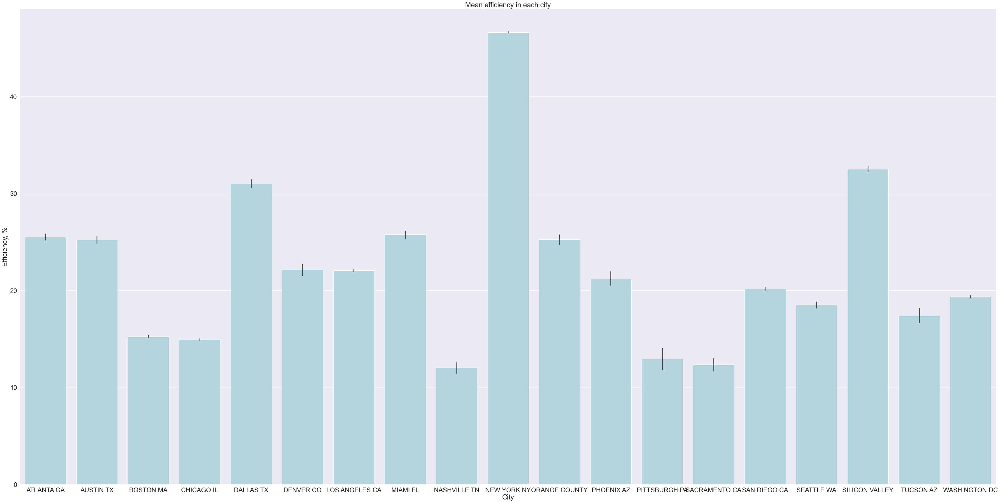
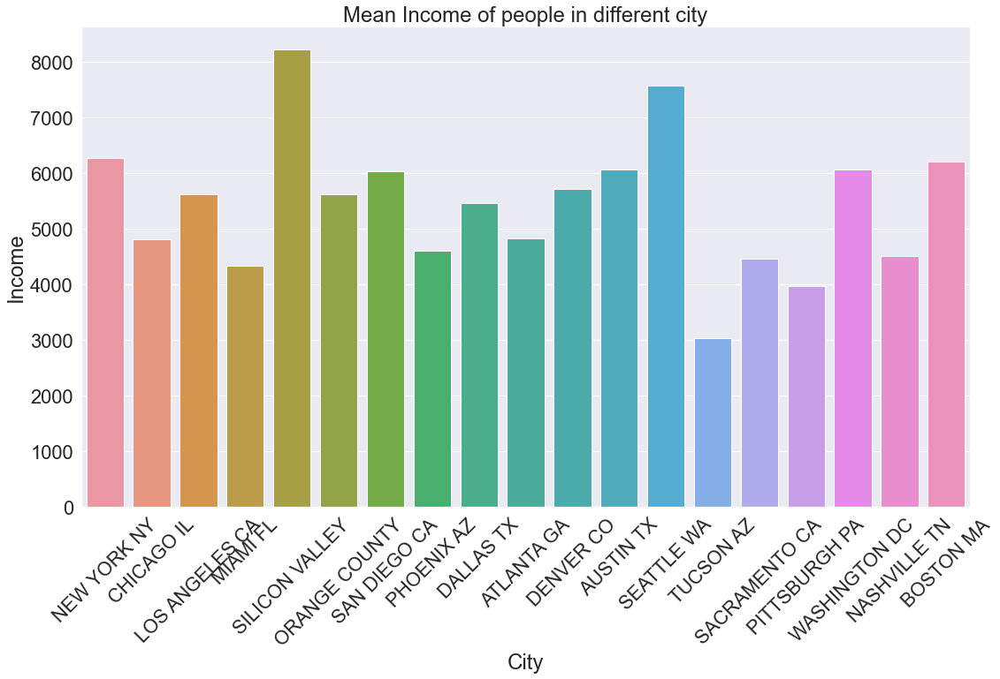

Result: The hypothesis is rejected.

Population is not as strong a factor influencing efficiency as the average income of clients.

- Hypothesis No.7: The higher the income of the company's customers, the higher its efficiency.

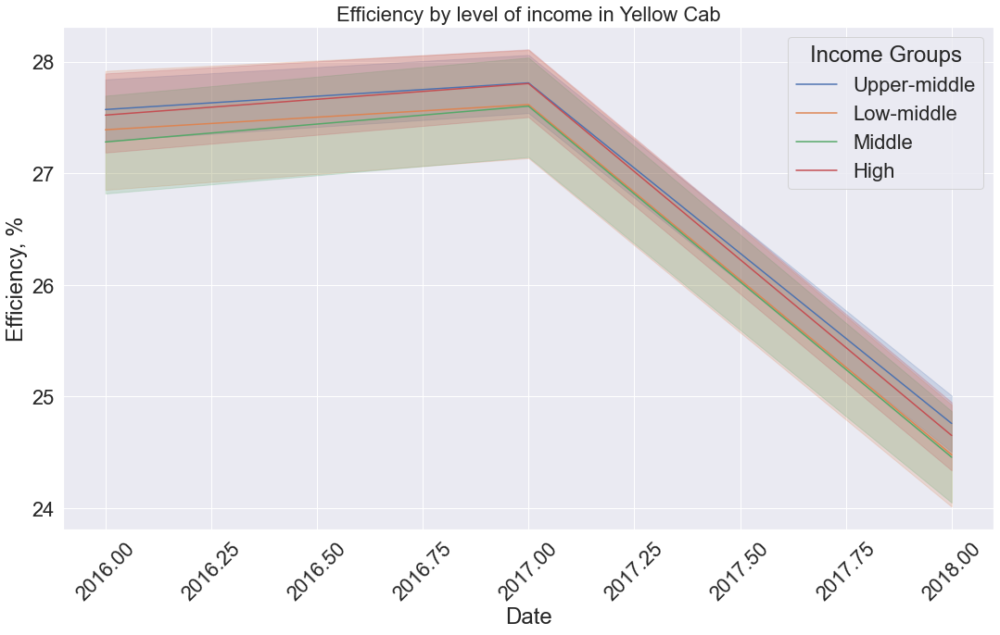
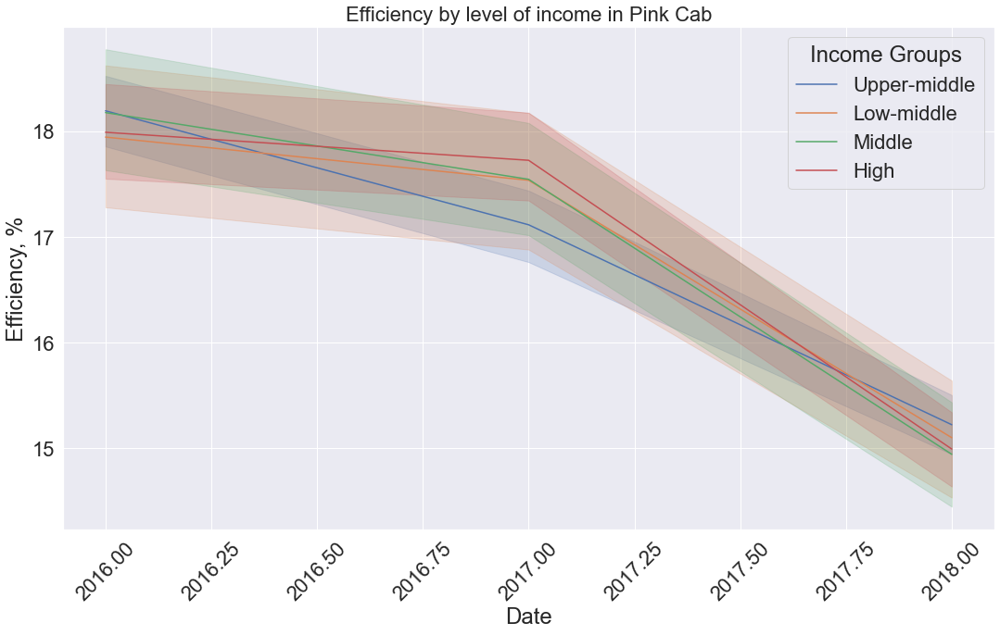

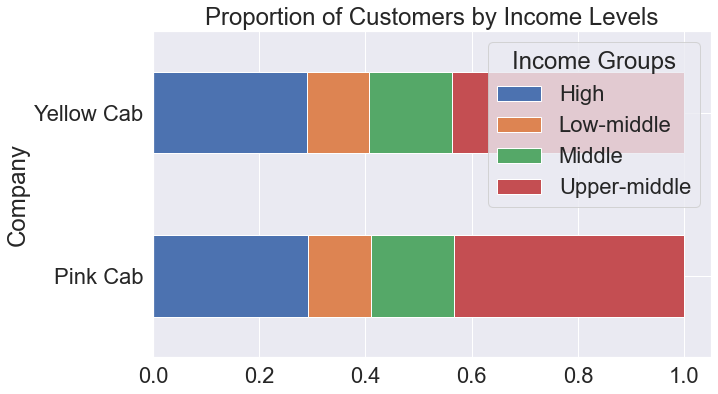

Result: The hypothesis is rejected.

Companies do not segment their services, they offer them the same services, so there is no difference in efficiency between different income groups of customers among these 2 companies. This is because the last graph shows that the distribution among clients of companies with different income levels does not differ.

- Hypothesis No.8: When paying for a trip with a bank card, the efficiency of the company is lower than when paying in cash.

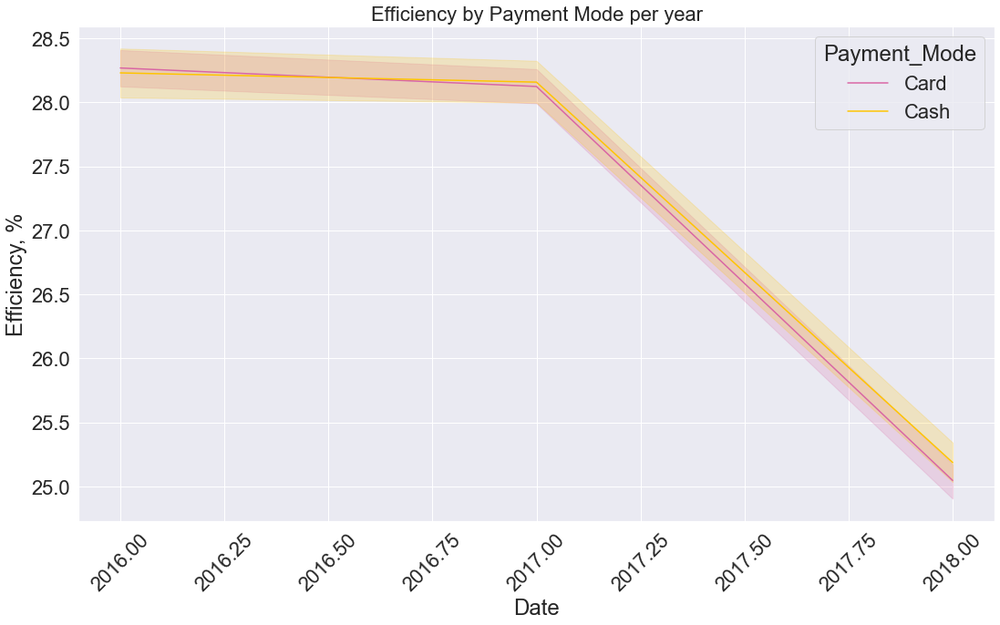
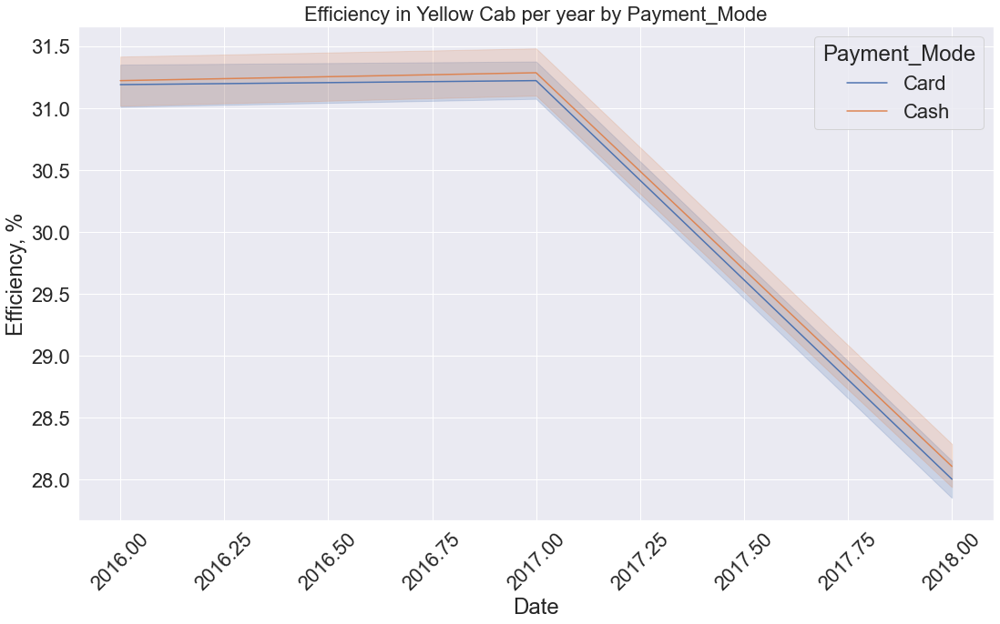
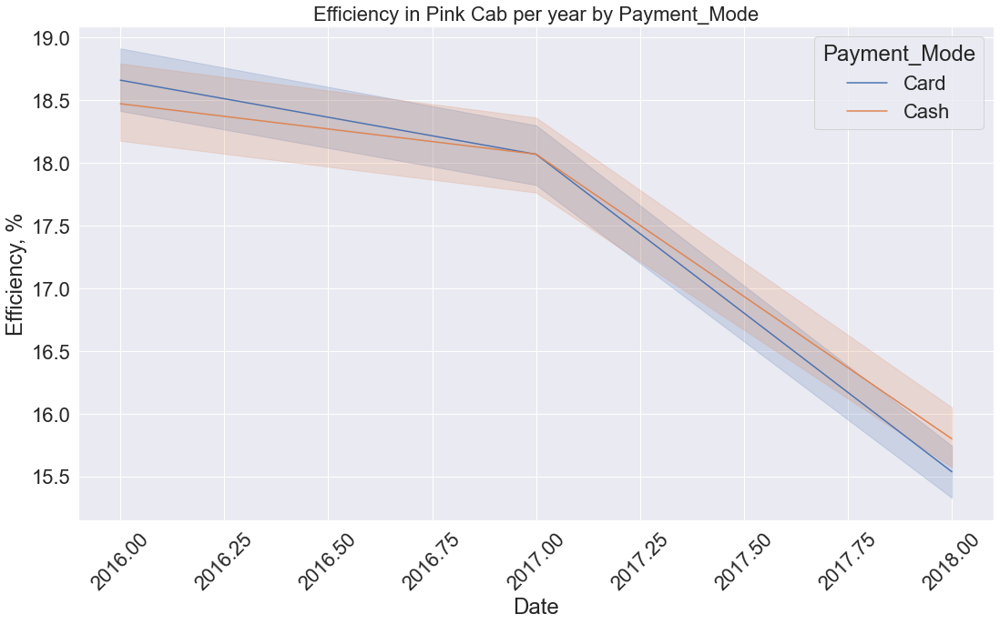
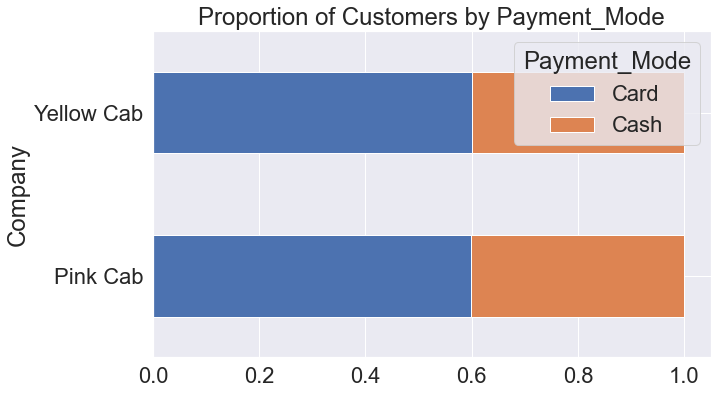

Result: The hypothesis is confirmed.

It is logical that the hypothesis was confirmed, since when paying with a card, companies incur transaction costs, so the efficiency is lower. But you can see that at the beginning of 2016, there are doubts. This is due to the fact that the "Pink Cab" company during this period has the opposite situation and the efficiency of paying by card is higher than when paying in cash. This may be due to the fraud of cab drivers who took the money for themselves, but this is just my guess. And later the situation leveled off and became similar to the situation with the "Yellow Cab" as shown in the general graph.

- Hypothesis No.9: Loyal customers lead to greater efficiency.

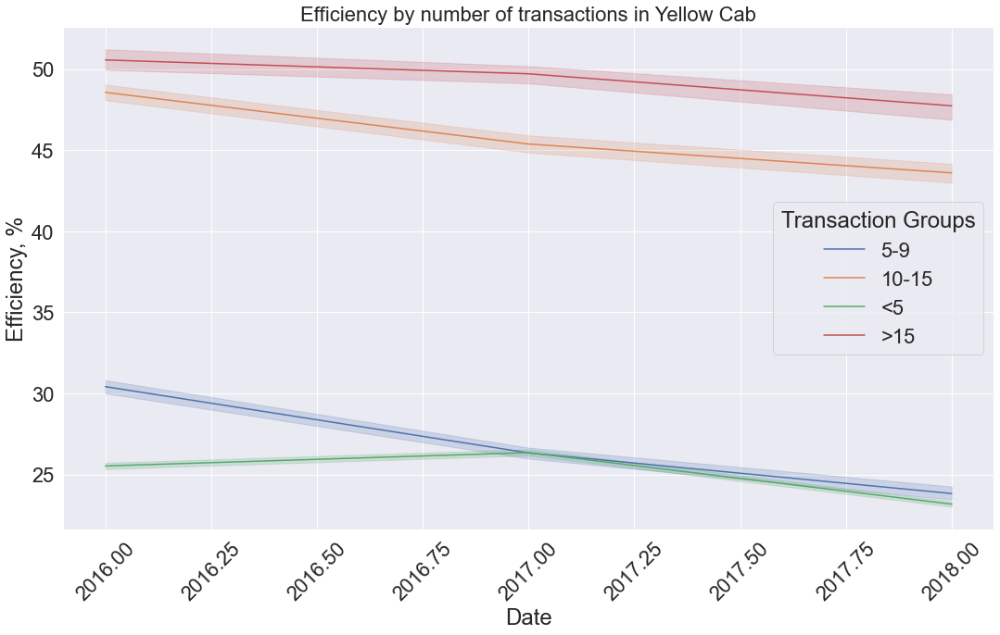
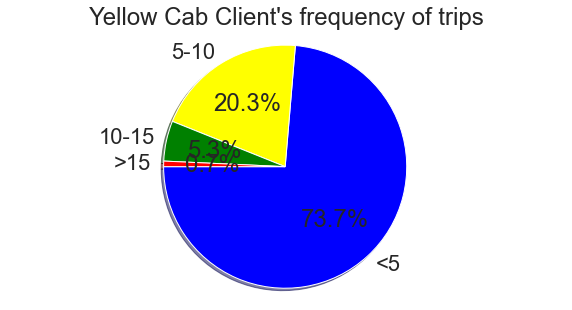
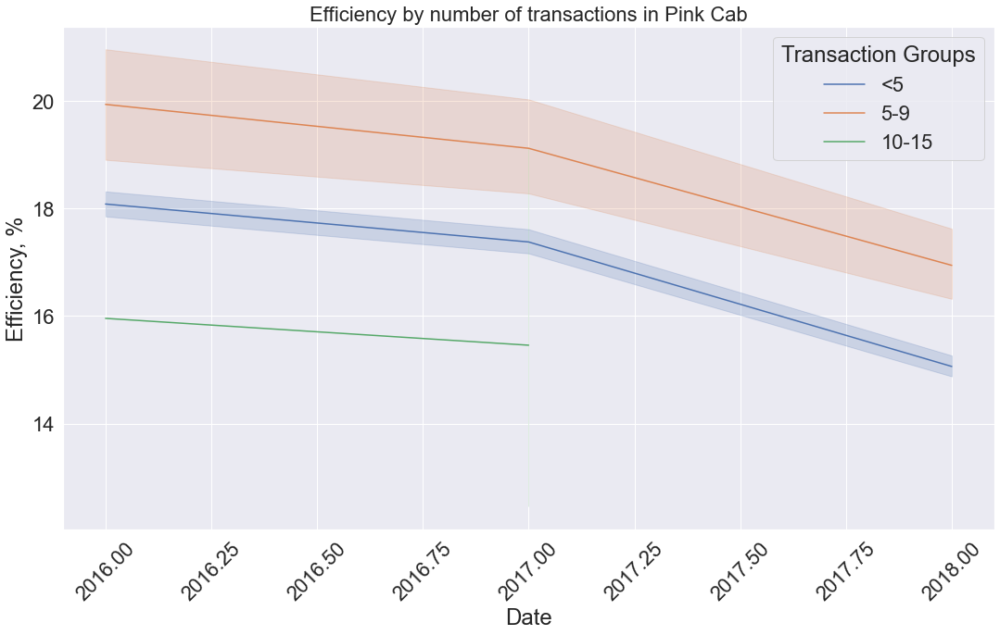
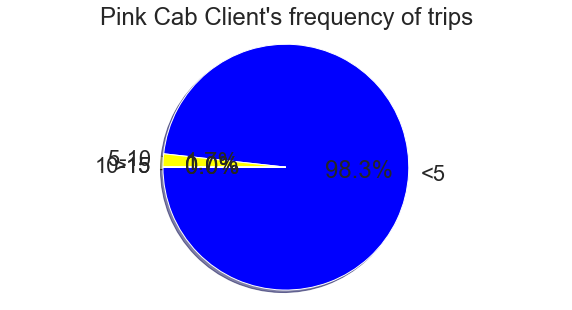

Result: The hypothesis is confirmed.

The hypothesis is confirmed in the case of the Yellow Cab company, but we believe that since the share of regular customers of the Pink Cab is less than 2%, these results can be ignored in confirming the hypothesis. Thus, the Yellow Cab data confirms the hypothesis and the more trips made by customers, the more efficiency they bring to the company.

- Hypothesis No.10: The more profit from one trip, the higher the efficiency.

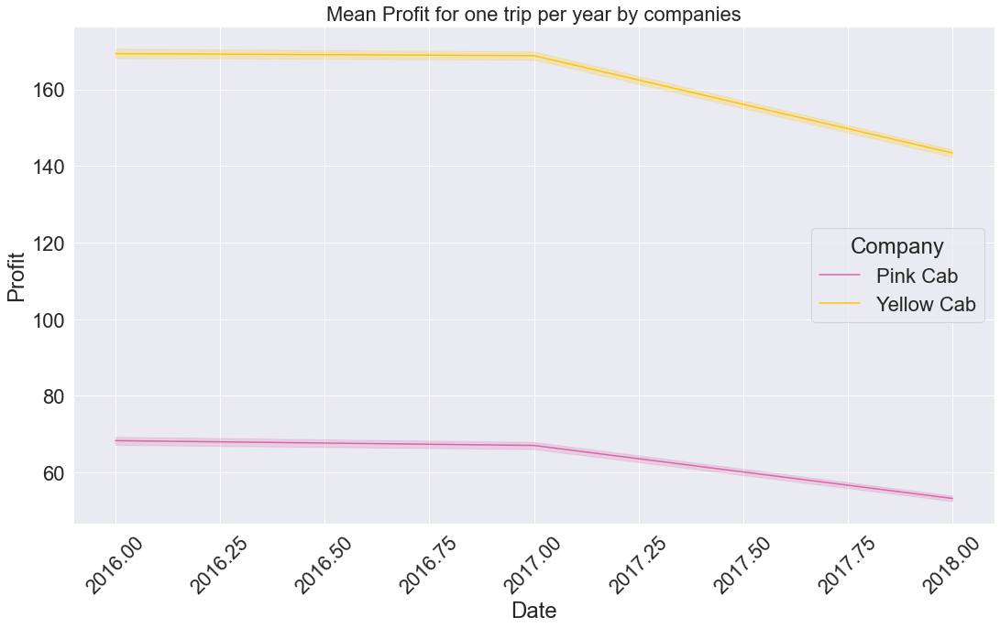
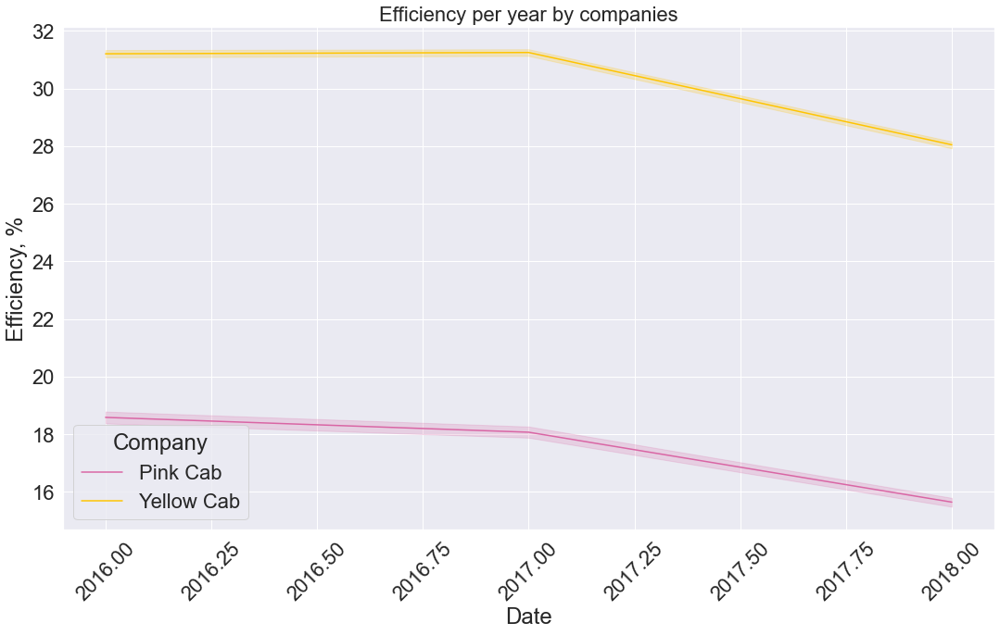

Result: The hypothesis is confirmed.

## Recomendations

1. The data shows us that the 2016-2018 market is expanding both in terms of demand and supply. This is due to a sharp slowdown in the growth of the number of transactions, which indicates the emergence of new companies in the industry and the reduction in the cost of a trip, as well as the attempts of the Yellow Cab and Pink Cab companies to maintain their existing share of customers by lowering prices. As we can see, the efficiency of the Yellow Cab remains above the market average even against the backdrop of a price reduction, so the Yellow Cab is more investment attractive from this point of view.

2. Looking at the efficiency by city, we saw that the efficiency is higher in those cities where the average income of people is higher. The Yellow Cab company has more market share in such cities. Therefore, the acquisition of such a company will allow doing business in cities with a large percentage of the solvent population.

3. Yellow and Pink Cabs account for 30% of the total number of cab users in large cities, while Yellow Cabs account for about 25%, so since we confirmed the hypothesis that the number of customers increases efficiency, it is more profitable to invest in this company than in Pink Cab.

4. The Yellow Cab company has not only a large market share, but also a large number of repeat customers, namely more than 25% of customers who have made a trip more than 5 times. In addition, the analysis of efficiency by group of loyal customers showed that customers who make more trips provide more efficiency for the company, which is also the growth potential of the Yellow Cab company.

5. Against the backdrop of declining revenue, it is important for the company to optimize its costs. After rising costs in 2017, the Yellow Cab company found resources to smoothly reduce costs, which also indicates a greater potential for the company's efficiency.

As a result, based on the above, the investment recommendation is to buy a Yellow Cab company.